# Chapter 4: Advanced Linear Models

In [1]:
import pymc3 as pm
import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
import numpy as np
from scipy import stats

import theano.tensor as tt
import theano

import datetime
print(f"Last Run {datetime.datetime.now()}")

Last Run 2021-08-29 16:41:39.834085


In [2]:
az.style.use("arviz-grayscale")
plt.rcParams['figure.dpi'] = 300 

In [3]:
babies = pd.read_csv('../data/babies.csv')
babies.head()

# Add a constant term so we can use a the dot product approach
babies["Intercept"] = 1

babies

,Month,Length,Intercept
0,0,48.5,1
1,0,50.5,1
2,0,50.5,1
3,0,52.0,1
4,0,47.5,1
...,...,...,...
795,24,87.5,1
796,24,82.5,1
797,24,88.5,1
798,24,89.0,1


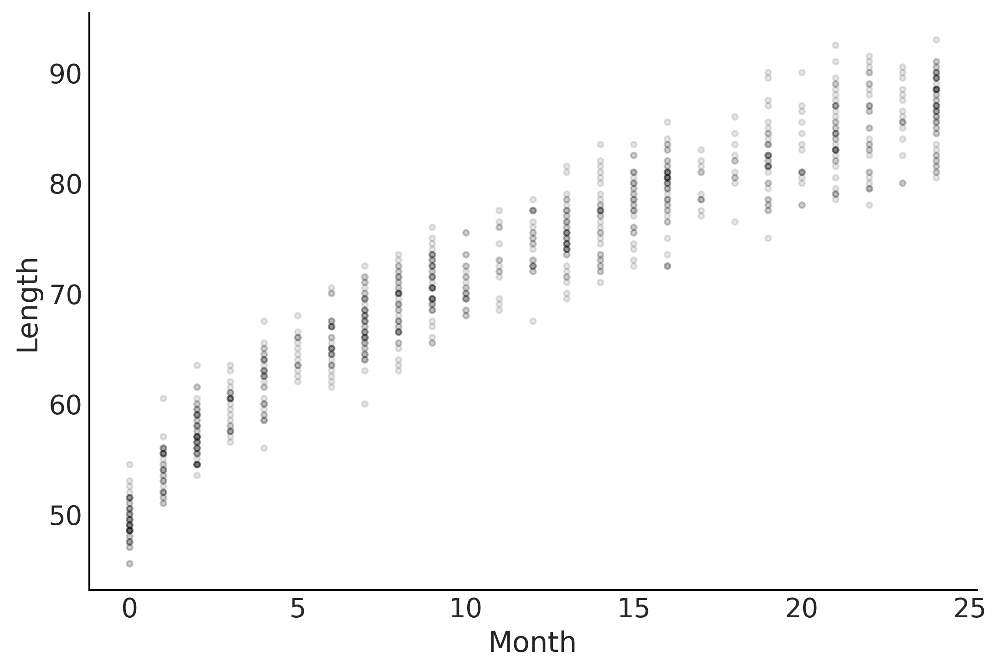

In [4]:
fig, ax = plt.subplots()

ax.plot(babies.Month, babies.Length, 'C0.', alpha=0.1)
ax.set_ylabel("Length")
ax.set_xlabel("Month");
plt.savefig('img/chp04/baby_length_scatter.png', dpi=300)

In [5]:
with pm.Model() as model_baby_linear:
    β = pm.Normal('β', sd=10, shape=2)
    
    # Use dot product instead of expanded multiplication
    μ = pm.Deterministic('μ', pm.math.dot(babies[["Intercept", "Month"]], β))
    ϵ = pm.HalfNormal('ϵ', sd=10)

    length = pm.Normal('length', mu=μ, sd=ϵ, observed=babies.Length)

    trace_baby_linear = pm.sample(2000, tune=4000)
    ppc_baby_linear = pm.sample_posterior_predictive(trace_baby_linear)
    inf_data_baby_linear = az.from_pymc3(trace=trace_baby_linear,
                                    posterior_predictive=ppc_baby_linear)

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/3985209041.py:10: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_baby_linear = pm.sample(2000, tune=4000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ϵ, β]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 19 seconds.
The acceptance probability does not match the target. It is 0.8928744388504535, but should be close to 0.8. Try to increase the number of tuning steps.


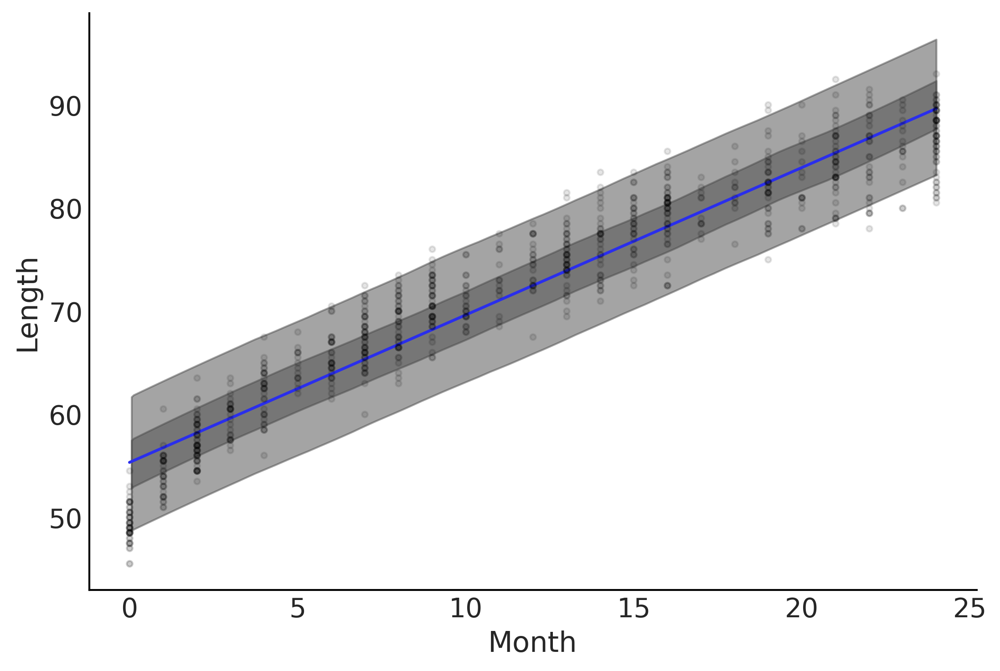

In [6]:
fig, ax = plt.subplots()

ax.set_ylabel("Length")
ax.set_xlabel("Month");

μ_m = inf_data_baby_linear.posterior["μ"].values.reshape(-1, babies.Length.shape[0]).mean(axis=0)

ax.plot(babies.Month, μ_m, c='C4')
az.plot_hdi(babies.Month, inf_data_baby_linear.posterior_predictive["length"], hdi_prob=.50, ax=ax)
az.plot_hdi(babies.Month, inf_data_baby_linear.posterior_predictive["length"], hdi_prob=.94, ax=ax)

ax.plot(babies.Month, babies.Length, 'C0.', alpha=0.1)

plt.savefig('img/chp04/baby_length_linear_fit.png', dpi=300)

In [7]:
az.loo(inf_data_baby_linear)

Computed from 8000 by 800 log-likelihood matrix

         Estimate       SE
elpd_loo -2133.31    18.59
p_loo        3.22        -

In [8]:
with pm.Model() as model_baby_sqrt:
    β = pm.Normal('β', sd=10, shape=2)

    μ = pm.Deterministic('μ', β[0] + β[1]*np.sqrt(babies.Month))
    σ = pm.HalfNormal('σ', sd=10)

    length = pm.Normal('length', mu=μ, sd=σ, observed=babies.Length)

    trace_baby_sqrt = pm.sample(2000, tune=4000)
    ppc_baby_sqrt = pm.sample_posterior_predictive(trace_baby_sqrt)
    inf_data_baby_sqrt = az.from_pymc3(trace=trace_baby_sqrt,
                                       posterior_predictive=ppc_baby_sqrt)


/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/903513916.py:9: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_baby_sqrt = pm.sample(2000, tune=4000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ, β]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 21 seconds.
The acceptance probability does not match the target. It is 0.8862620151675893, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.6314325569453614, but should be close to 0.8. Try to increase the number of tuning steps.


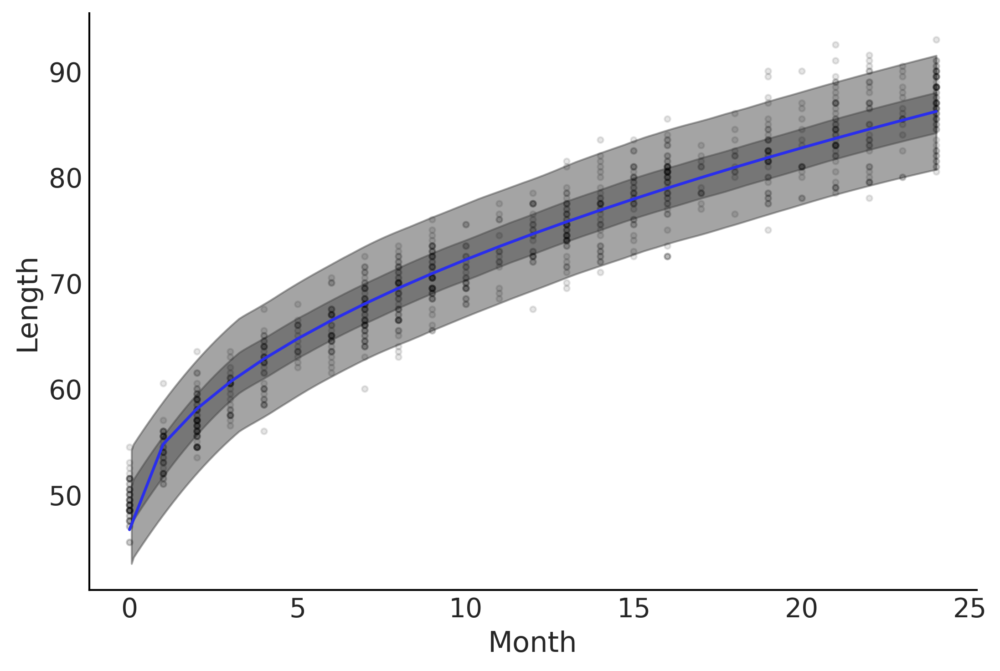

In [9]:
fig, ax = plt.subplots()

ax.plot(babies.Month, babies.Length, 'C0.', alpha=0.1)

ax.set_ylabel("Length")
ax.set_xlabel("Month");

μ_m = inf_data_baby_sqrt.posterior["μ"].values.reshape(-1, babies.Length.shape[0]).mean(axis=0)

az.plot_hdi(babies.Month, inf_data_baby_sqrt.posterior_predictive["length"], hdi_prob=.50, ax=ax)
az.plot_hdi(babies.Month, inf_data_baby_sqrt.posterior_predictive["length"], hdi_prob=.94, ax=ax)

ax.plot(babies.Month, μ_m, c='C4')

plt.savefig('img/chp04/baby_length_sqrt_fit.png', dpi=300)

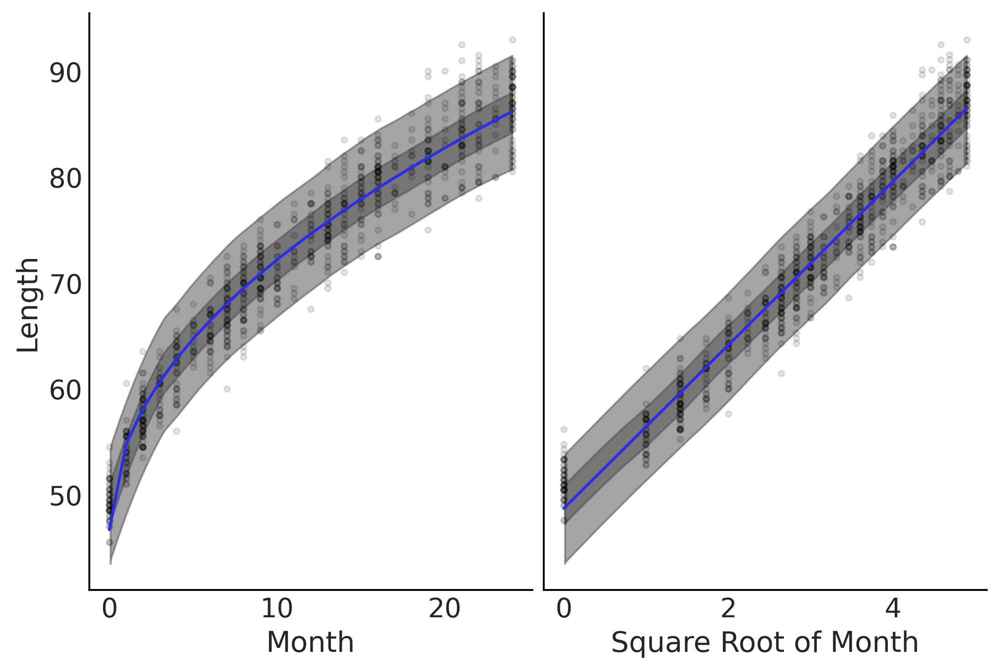

In [10]:
fig, axes = plt.subplots(1,2)
axes[0].plot(babies.Month, babies.Length, 'C0.', alpha=0.1)

μ_m = inf_data_baby_sqrt.posterior["μ"].values.reshape(-1, babies.Length.shape[0]).mean(axis=0)

axes[0].plot(babies.Month, μ_m, c='C4')
az.plot_hdi(babies.Month, inf_data_baby_sqrt.posterior_predictive["length"], hdi_prob=.50, ax=axes[0])
az.plot_hdi(babies.Month, inf_data_baby_sqrt.posterior_predictive["length"], hdi_prob=.94, ax=axes[0])

axes[0].set_ylabel("Length")
axes[0].set_xlabel("Month");

axes[1].plot(np.sqrt(babies.Month), babies.Length, 'C0.', alpha=0.1)
axes[1].set_xlabel("Square Root of Month");

az.plot_hdi(np.sqrt(babies.Month), inf_data_baby_sqrt.posterior_predictive["length"], hdi_prob=.50, ax=axes[1])
az.plot_hdi(np.sqrt(babies.Month), inf_data_baby_sqrt.posterior_predictive["length"], hdi_prob=.94, ax=axes[1])
axes[1].plot(np.sqrt(babies.Month), μ_m, c='C4')

axes[1].set_yticks([])
axes[1]

plt.savefig('img/chp04/baby_length_sqrt_fit.png', dpi=300)

In [11]:
az.compare({"Linear Model":inf_data_baby_linear, "Non Linear Model":inf_data_baby_sqrt})

/Users/canyon/miniconda3/envs/bmcp/lib/python3.9/site-packages/arviz/stats/stats.py:145: UserWarning: The default method used to estimate the weights for each model,has changed from BB-pseudo-BMA to stacking
  warnings.warn(


,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
Non Linear Model,0,-1968.202442,3.062630,0.000000,0.929299,18.968351,0.000000,False,log
Linear Model,1,-2133.314720,3.217174,165.112278,0.070701,18.594588,20.064059,False,log


## Varying Variance

In [12]:
with pm.Model() as model_baby_vv:
    β = pm.Normal('β', sd=10, shape=2)
    
    # Additional variance terms
    δ = pm.HalfNormal('δ', sd=10, shape=2)

    μ = pm.Deterministic('μ', β[0] + β[1]* np.sqrt(babies.Month))
    σ = pm.Deterministic('σ', δ[0] + δ[1] * babies.Month.values)

    length = pm.Normal('length', mu=μ, sd=σ, observed=babies.Length)
    
    
    trace_baby_vv = pm.sample(2000, target_accept=.95)
    ppc_baby_vv = pm.sample_posterior_predictive(trace_baby_vv,
                                                 var_names=["length", "σ"])
    inf_data_baby_vv = az.from_pymc3(trace=trace_baby_vv,
                                     posterior_predictive=ppc_baby_vv)

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/3227541685.py:13: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_baby_vv = pm.sample(2000, target_accept=.95)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [δ, β]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 21 seconds.


In [13]:
az.summary(inf_data_baby_vv, var_names=["δ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
δ[0],2.379,0.118,2.168,2.614,0.002,0.002,3001.0,3264.0,1.0
δ[1],0.038,0.010,0.020,0.056,0.000,0.000,2942.0,2937.0,1.0


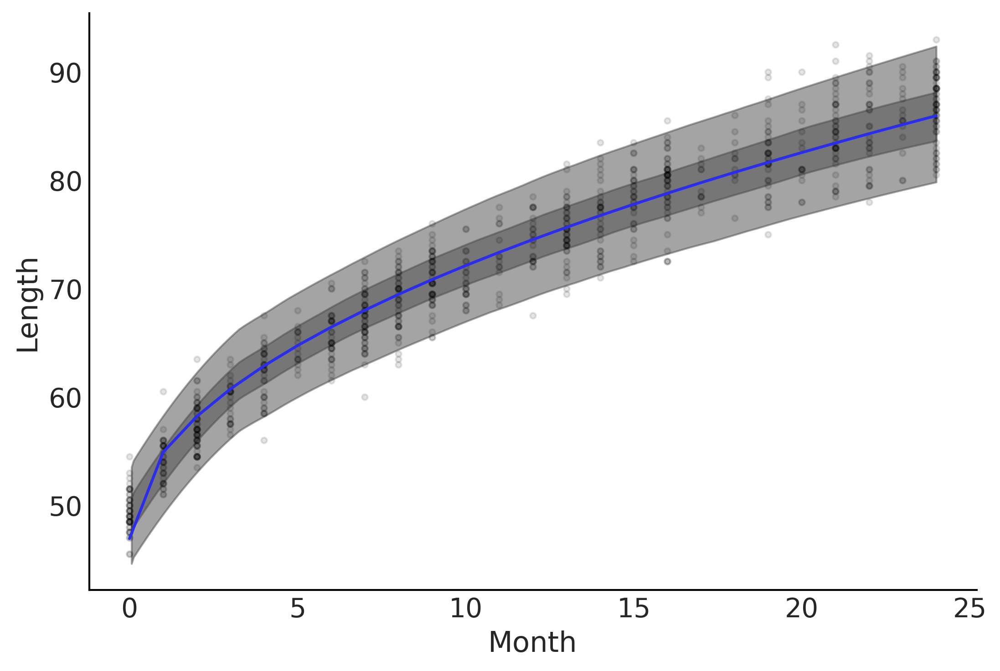

In [14]:
fig, ax = plt.subplots()

ax.set_ylabel("Length")
ax.set_xlabel("Month");

ax.plot(babies.Month, babies.Length, 'C0.', alpha=0.1)

μ_m = inf_data_baby_vv.posterior["μ"].values.reshape(-1, babies.Length.shape[0]).mean(axis=0)

ax.plot(babies.Month, μ_m, c='C4')

az.plot_hdi(babies.Month, inf_data_baby_vv.posterior_predictive["length"], hdi_prob=.50, ax=ax)
az.plot_hdi(babies.Month, inf_data_baby_vv.posterior_predictive["length"], hdi_prob=.94, ax=ax)

plt.savefig('img/chp04/baby_length_sqrt_vv_fit.png', dpi=300)

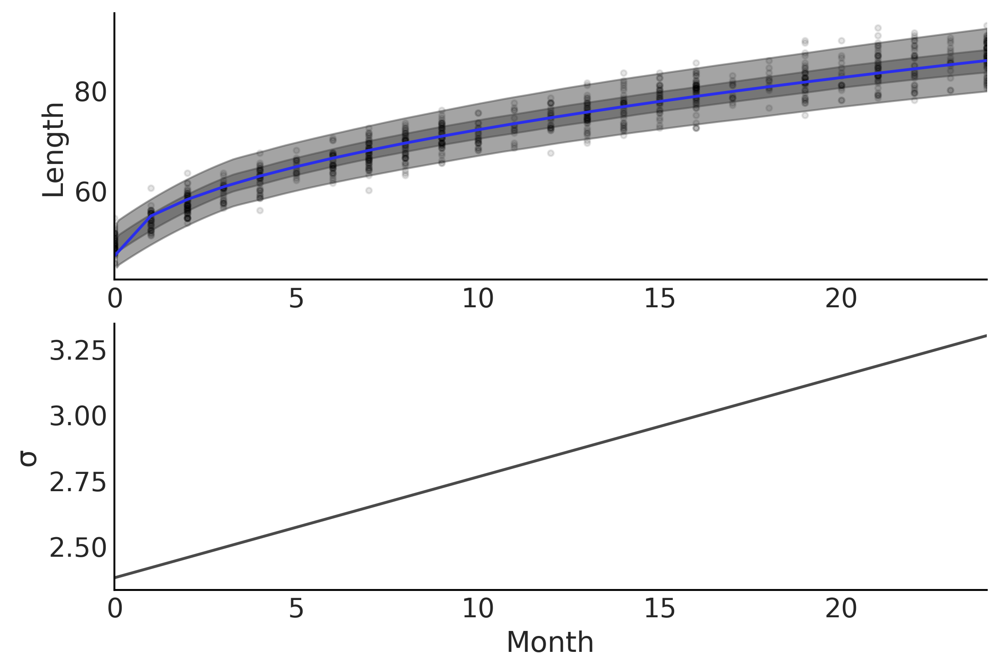

In [15]:
fig, axes = plt.subplots(2,1)

axes[0].plot(babies.Month, babies.Length, 'C0.', alpha=0.1)

μ_m = inf_data_baby_vv.posterior["μ"].values.reshape(-1, babies.Length.shape[0]).mean(axis=0)

axes[0].plot(babies.Month, μ_m, c='C4')

az.plot_hdi(babies.Month, inf_data_baby_vv.posterior_predictive["length"], hdi_prob=.50, ax=axes[0])
az.plot_hdi(babies.Month, inf_data_baby_vv.posterior_predictive["length"], hdi_prob=.94, ax=axes[0])
axes[0].set_ylabel("Length")

σ_m = inf_data_baby_vv.posterior["σ"].values.reshape(-1, 800).mean(axis=0)

axes[1].plot(babies.Month, σ_m, c='C1')

axes[1].set_ylabel("σ")
axes[1].set_xlabel("Month")

axes[0].set_xlim(0,24)
axes[1].set_xlim(0,24)

plt.savefig('img/chp04/baby_length_sqrt_vv_fit_include_error.png', dpi=300)

## Interaction effects
If we think things vary by group we need to add an interaction effect. In our case lets say we believe gender interacts with flipper length and redo that regression we did earlier

In [16]:
tips_df = pd.read_csv('../data/tips.csv')
tips_df.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [17]:
tips = tips_df.tip
total_bill_c = (tips_df.total_bill - tips_df.total_bill.mean())  
smoker = pd.Categorical(tips_df.smoker).codes

with pm.Model() as model_no_interaction:
    β = pm.Normal('β', mu=0, sd=1, shape=3)
    σ = pm.HalfNormal('σ', 1)

    μ = (β[0] +
         β[1] * total_bill_c + 
         β[2] * smoker)

    obs = pm.Normal('obs', μ, σ, observed=tips)
    trace_no_interaction = pm.sample(1000, tune=1000)

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/672498043.py:14: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_no_interaction = pm.sample(1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ, β]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 15 seconds.


/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/2436504886.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  pred_y_non_smokers = β0_nonint + β1_nonint * total_bill_c[:,None]
/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/2436504886.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  pred_y_smokers = β0_nonint + β1_nonint * total_bill_c[:,None] + β2_nonint


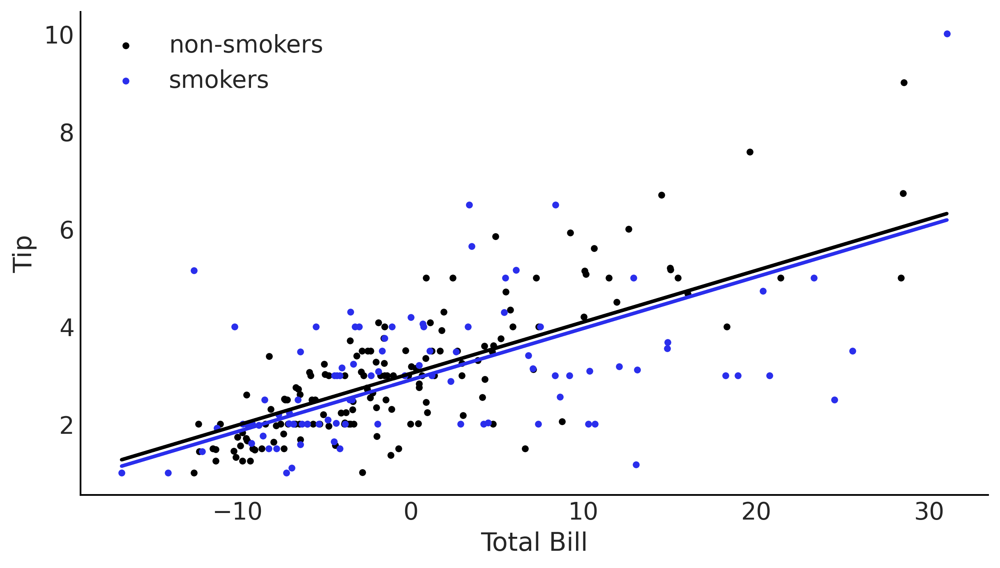

In [18]:
_, ax = plt.subplots(figsize=(8, 4.5))

β0_nonint = trace_no_interaction['β'][:,0]
β1_nonint = trace_no_interaction['β'][:,1]
β2_nonint = trace_no_interaction['β'][:,2]

pred_y_non_smokers = β0_nonint + β1_nonint * total_bill_c[:,None]
pred_y_smokers = β0_nonint + β1_nonint * total_bill_c[:,None] + β2_nonint

ax.scatter(total_bill_c[smoker==0], tips[smoker==0], label='non-smokers', marker='.')
ax.scatter(total_bill_c[smoker==1], tips[smoker==1], label='smokers', marker='.', c="C4")
ax.set_xlabel('Total Bill')
ax.set_ylabel('Tip')
ax.legend()

ax.plot(total_bill_c, pred_y_non_smokers.mean(1), lw=2)
ax.plot(total_bill_c, pred_y_smokers.mean(1), lw=2, c="C4");

In [19]:
with pm.Model() as model_interaction:
    β = pm.Normal('β', mu=0, sd=1, shape=4)
    σ = pm.HalfNormal('σ', 1)

    μ = (β[0] +
         β[1] * total_bill_c + 
         β[2] * smoker +
         β[3] * smoker * total_bill_c
        )

    obs = pm.Normal('obs', μ, σ, observed=tips)
    trace_interaction = pm.sample(1000, tune=1000)

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/2013377323.py:12: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_interaction = pm.sample(1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ, β]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 15 seconds.


/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/1955462507.py:10: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  pred_y_non_smokers = β0_nonint + β1_nonint * total_bill_c[:,None]
/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/1955462507.py:11: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  pred_y_smokers = β0_nonint + β1_nonint * total_bill_c[:,None] + β2_nonint
/Users/canyon/miniconda3/envs/bmcp/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/canyon/miniconda3/envs/bmcp/lib/python3.9/site-packages/a

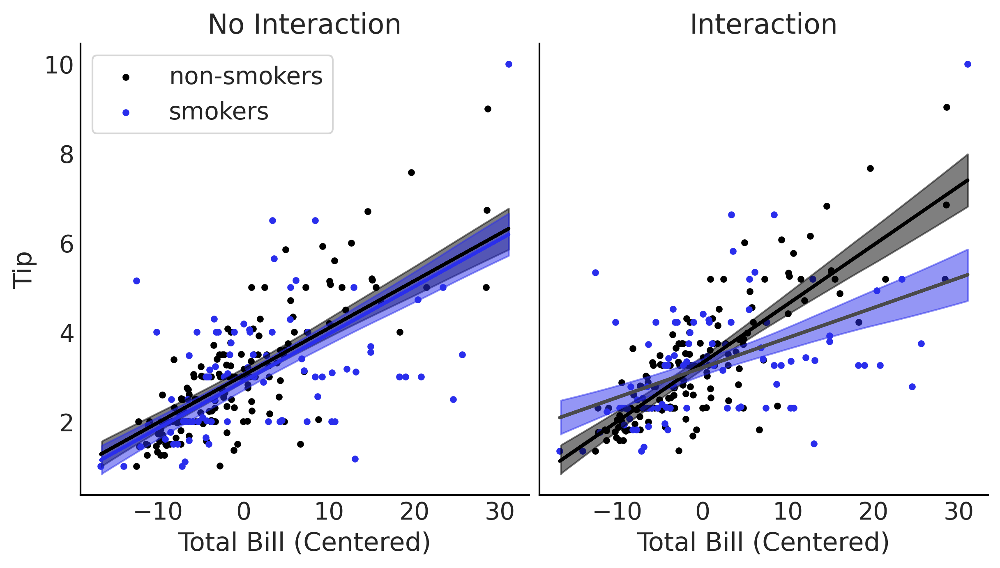

In [20]:
_, ax = plt.subplots(1, 2, figsize=(8, 4.5))

#α_nonint = trace_nonint['α']

β0_nonint = trace_no_interaction['β'][:,0]
β1_nonint = trace_no_interaction['β'][:,1]
β2_nonint = trace_no_interaction['β'][:,2]


pred_y_non_smokers = β0_nonint + β1_nonint * total_bill_c[:,None]
pred_y_smokers = β0_nonint + β1_nonint * total_bill_c[:,None] + β2_nonint

ax[0].scatter(total_bill_c[smoker==0], tips[smoker==0], label='non-smokers', marker='.')
ax[0].scatter(total_bill_c[smoker==1], tips[smoker==1], label='smokers', marker='.', c="C4")
ax[0].set_xlabel('Total Bill (Centered)')
ax[0].set_ylabel('Tip')
ax[0].legend(frameon=True)

ax[0].plot(total_bill_c, pred_y_non_smokers.mean(1), lw=2)
ax[0].plot(total_bill_c, pred_y_smokers.mean(1), lw=2, c="C4")
ax[0].set_title('No Interaction')


az.plot_hdi(total_bill_c, pred_y_non_smokers.T, color='C0', ax=ax[0])
az.plot_hdi(total_bill_c, pred_y_smokers.T, ax=ax[0], color="C4");

β0_int = trace_interaction['β'][:,0]
β1_int = trace_interaction['β'][:,1]
β2_int = trace_interaction['β'][:,2]
β3_int = trace_interaction['β'][:,3]

# Because smoker=0 I am ommiting the terms including the smoker covariate
pred_y_non_smokers = (β0_int +
                      β1_int * total_bill_c[:, None])

# Because x1=1 I am ommiting x1
pred_y_smokers = (β0_int +
                  β1_int * total_bill_c[:, None] +
                  β2_int +
                  β3_int * total_bill_c[:, None])


ax[1].scatter(total_bill_c[smoker==0], tips[smoker==0], label='non-smokers', marker='.')
ax[1].scatter(total_bill_c[smoker==1], tips[smoker==1], label='smokers', marker='.', c="C4")
ax[1].set_xlabel('Total Bill (Centered)')
ax[1].set_yticks([])

ax[1].set_title('Interaction')

ax[1].plot(total_bill_c, pred_y_non_smokers.mean(1), lw=2)
ax[1].plot(total_bill_c, pred_y_smokers.mean(1), lw=2)
az.plot_hdi(total_bill_c, pred_y_non_smokers.T, color='C0', ax=ax[1])
az.plot_hdi(total_bill_c, pred_y_smokers.T, ax=ax[1], color="C4");

plt.savefig('img/chp04/smoker_tip_interaction.png', dpi=300)

# Robust Regression

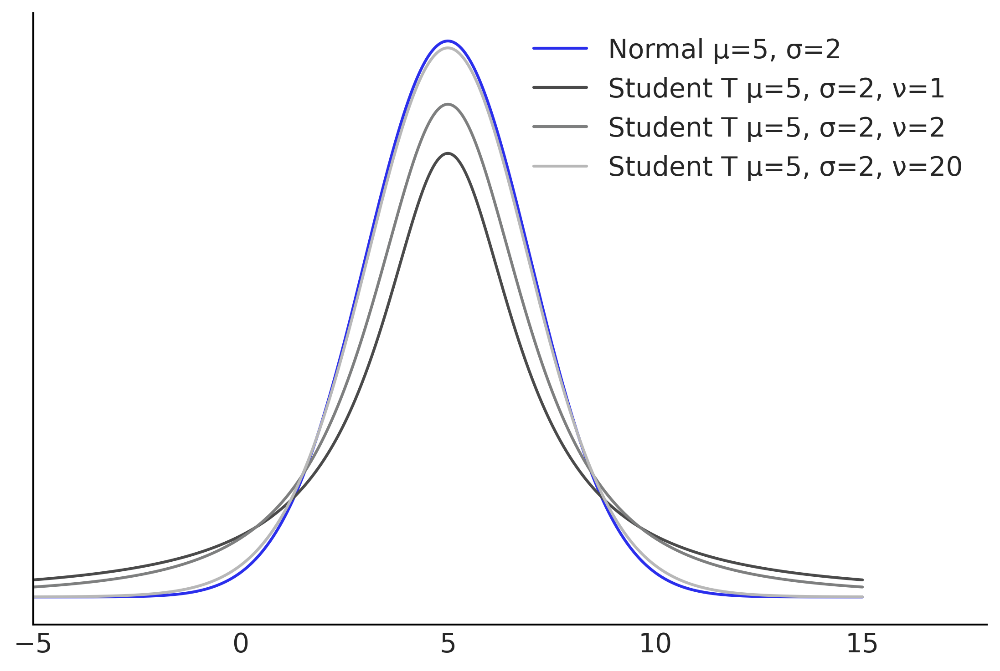

In [21]:
mean = 5
sigma = 2

x = np.linspace(-5, 15, 1000)
fig, ax = plt.subplots()

ax.plot(x, stats.norm(5,2).pdf(x), label=f"Normal μ={mean}, σ={sigma}", color="C4")

for i, nu in enumerate([1, 2, 20],1):
    ax.plot(x, stats.t(loc=5, scale=2, df=nu).pdf(x), label=f"Student T μ={mean}, σ={sigma}, ν={nu}", color=f"C{i}")

ax.set_xlim(-5, 18)
ax.legend(loc="upper right", frameon=False)
ax.set_yticks([])
plt.savefig('img/chp04/studentt_normal_comparison.png', dpi=300)

In [23]:
def generate_sales(*, days, mean, std, label):
    np.random.seed(0)
    df = pd.DataFrame(index=range(1, days+1), columns=["customers", "sales"])
    for day in range(1, days+1):
        num_customers = stats.randint(30, 100).rvs()+1
        
        # This is correct as there is an independent draw for each customers orders
        dollar_sales = stats.norm(mean, std).rvs(num_customers).sum()
        
        df.loc[day, "customers"] = num_customers
        df.loc[day, "sales"] = dollar_sales
        
    # Fix the types as not to cause Theano errors
    df = df.astype({'customers': 'int32', 'sales': 'float32'})
    
    # Sorting will make plotting the posterior predictive easier later
    df["Food_Category"] = label
    df = df.sort_values("customers")
    return df


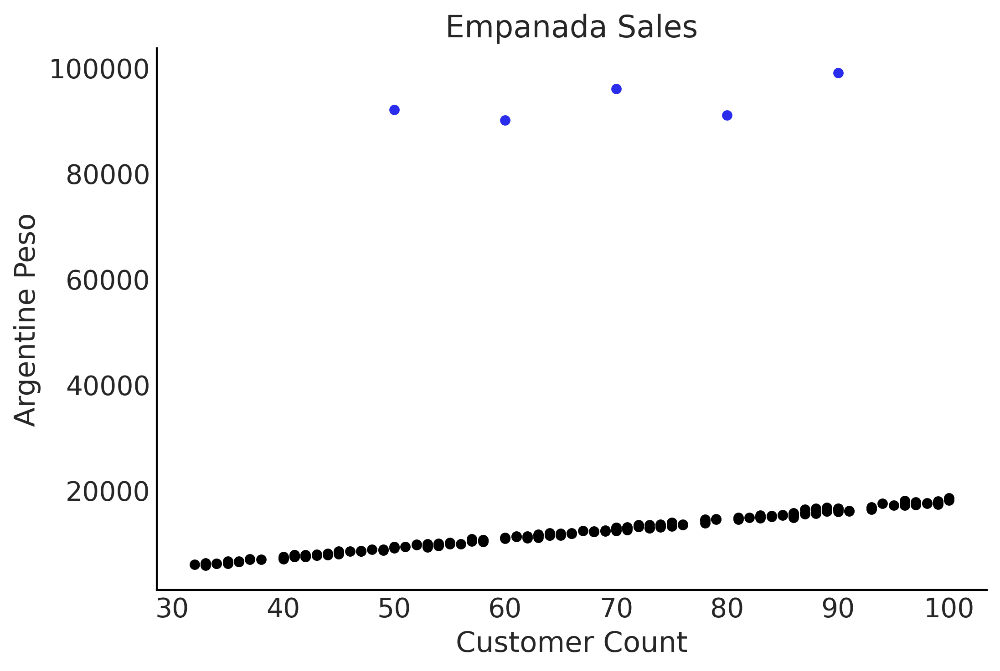

In [24]:
fig, ax = plt.subplots()

empenadas =  generate_sales(days=200, mean=180, std=30, label="Empenada")
empenadas.iloc[0] = [50, 92000, "Empenada"]
empenadas.iloc[1] = [60, 90000, "Empenada"]
empenadas.iloc[2] = [70, 96000, "Empenada"]
empenadas.iloc[3] = [80, 91000, "Empenada"]
empenadas.iloc[4] = [90, 99000, "Empenada"]

empenadas = empenadas.sort_values("customers")

empenadas.sort_values("sales")[:-5].plot(x="customers", y="sales", kind="scatter", ax=ax);
empenadas.sort_values("sales")[-5:].plot(x="customers", y="sales", kind="scatter", c="C4", ax=ax);

ax.set_ylabel("Argentine Peso")
ax.set_xlabel("Customer Count")
ax.set_title("Empanada Sales")
plt.savefig('img/chp04/empanada_scatter_plot.png', dpi=300)

In [25]:
with pm.Model() as model_non_robust:
    σ = pm.HalfNormal("σ", 50)
    β = pm.Normal('β', mu=150, sd=20)

    μ = pm.Deterministic('μ', β * empenadas.customers)
    
    sales = pm.Normal("sales", mu=μ, sd=σ, observed=empenadas.sales)
    
    trace_empanada_sales = pm.sample(random_seed=0)
    ppc_empanada_sales = pm.sample_posterior_predictive(
                                    trace_empanada_sales)
    inf_data_non_robust = az.from_pymc3(trace = trace_empanada_sales, posterior_predictive=ppc_empanada_sales)

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/3904516038.py:9: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_empanada_sales = pm.sample(random_seed=0)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β, σ]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 21 seconds.
The acceptance probability does not match the target. It is 0.9338463896924831, but should be close to 0.8. Try to increase the number of tuning steps.


### Plot of Non Robust Regression Fit

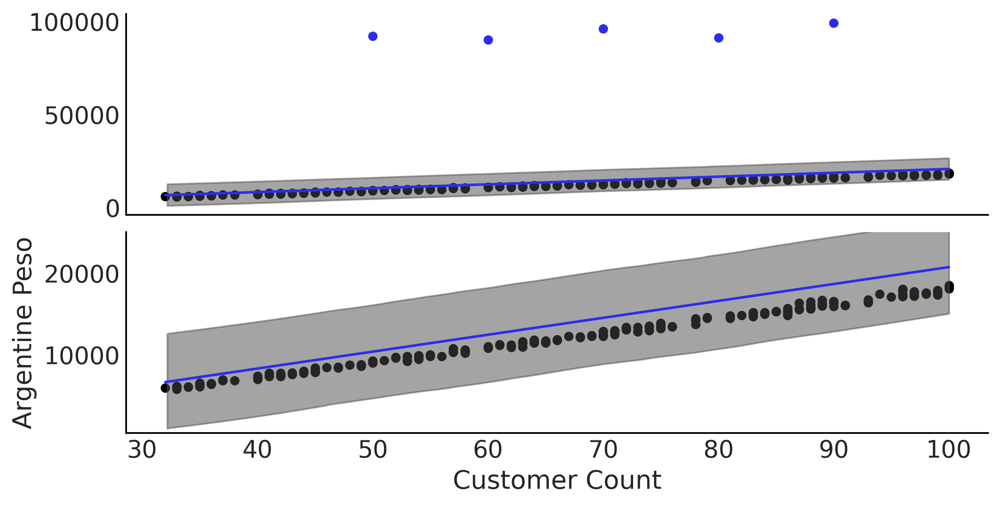

In [26]:
fig, axes = plt.subplots(2, 1, figsize=(8, 4), sharex=True)
μ_m = inf_data_non_robust.posterior["μ"].values.reshape(-1, empenadas.shape[0]).mean(axis=0)

for i in range(2):
    empenadas.sort_values("sales")[:-5].plot(x="customers", y="sales", kind="scatter", ax=axes[i]);
    empenadas.sort_values("sales")[-5:].plot(x="customers", y="sales", kind="scatter", c="C4", ax=axes[i]);
    axes[i].plot(empenadas.customers, μ_m, c='C4')
    az.plot_hdi(empenadas.customers, inf_data_non_robust.posterior_predictive["sales"], hdi_prob=.95, ax=axes[i])

    axes[1].set_ylabel("Argentine Peso")

axes[0].set_ylabel("")
axes[1].set_xlabel("Customer Count")
axes[1].set_ylim(400, 25000);
plt.savefig('img/chp04/empanada_scatter_non_robust.png', dpi=300)

In [27]:
az.summary(inf_data_non_robust, kind="stats", var_names=["β", "σ"]).round(1)

,mean,sd,hdi_3%,hdi_97%
β,207.0,3.0,201.3,212.2
σ,2950.4,24.4,2907.4,2997.4


In [28]:
with pm.Model() as model_robust_regression:
    σ = pm.HalfNormal("σ", 50)
    β = pm.Normal('β', mu=150, sd=20)
    ν = pm.HalfNormal("ν", 20)

    μ = pm.Deterministic('μ', β * empenadas.customers)
    
    sales = pm.StudentT("sales", mu=μ, sd=σ, nu=ν,
                        observed=empenadas.sales)
        
    trace_empanada_sales_robust = pm.sample(random_seed=0)
    ppc_empanada_sales_robust = pm.sample_posterior_predictive(
                                        trace_empanada_sales_robust)
    
    inf_data_robust = az.from_pymc3(trace = trace_empanada_sales_robust,
                                    posterior_predictive=ppc_empanada_sales_robust)

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/513098304.py:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_empanada_sales_robust = pm.sample(random_seed=0)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ν, β, σ]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 14 seconds.


In [29]:
az.summary(inf_data_robust, var_names=["β", "σ", "ν"], kind="stats").round(1)

,mean,sd,hdi_3%,hdi_97%
β,179.6,0.3,179.1,180.1
σ,152.0,13.9,126.4,178.4
ν,1.3,0.2,1.0,1.6


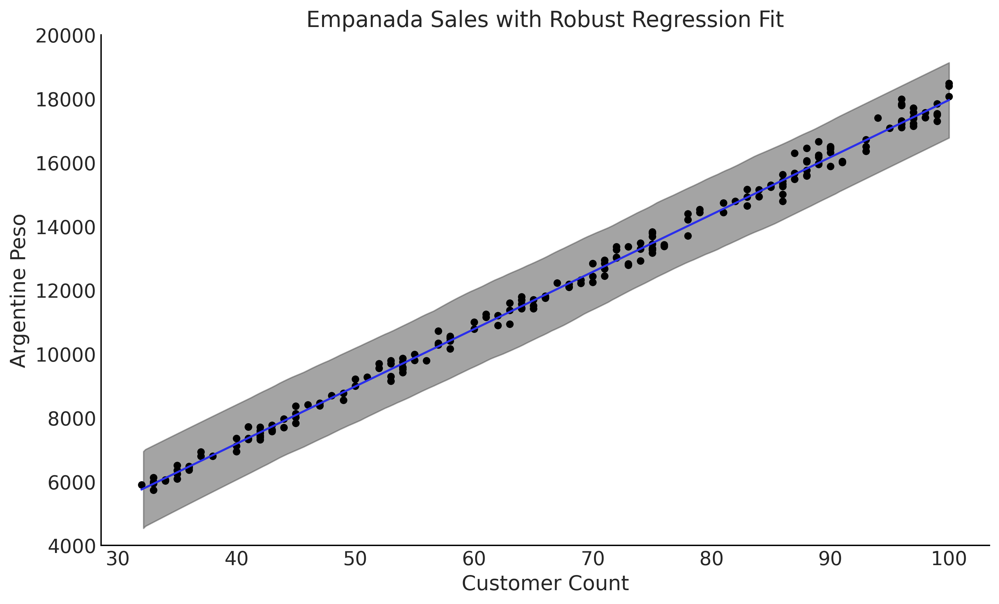

In [30]:
fig, ax = plt.subplots(figsize=(10, 6))
μ_m = inf_data_robust.posterior["μ"].values.reshape(-1, empenadas.shape[0]).mean(axis=0)

ax.plot(empenadas.customers, μ_m, c='C4')
az.plot_hdi(empenadas.customers, inf_data_robust.posterior_predictive["sales"], hdi_prob=.95, ax=ax)

empenadas.plot(x="customers", y="sales", kind="scatter", ax=ax)
ax.set_ylim(4000, 20000);
ax.set_ylabel("Argentine Peso")
ax.set_xlabel("Customer Count")
ax.set_title("Empanada Sales with Robust Regression Fit")
plt.savefig('img/chp04/empanada_scatter_robust.png', dpi=300)

In [31]:
az.compare({"Non robust": inf_data_non_robust, "Robust":inf_data_robust})

/Users/canyon/miniconda3/envs/bmcp/lib/python3.9/site-packages/arviz/stats/stats.py:145: UserWarning: The default method used to estimate the weights for each model,has changed from BB-pseudo-BMA to stacking
  warnings.warn(
/Users/canyon/miniconda3/envs/bmcp/lib/python3.9/site-packages/arviz/stats/stats.py:655: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
Robust,0,-1473.978565,5.912134,0.000000,1.000000e+00,31.902351,0.00000,False,log
Non robust,1,-3704.776744,151.683215,2230.798178,1.576382e-09,832.113956,802.36599,True,log


# Multilevel models

## Generate data for two restaurant categories

In [32]:
def generate_sales(*, days, mean, std, label):
    np.random.seed(0)
    df = pd.DataFrame(index=range(1, days+1), columns=["customers", "sales"])
    for day in range(1, days+1):
        num_customers = stats.randint(30, 100).rvs()+1
        
        # This is correct as there is an independent draw for each customers orders
        dollar_sales = stats.norm(mean, std).rvs(num_customers).sum()
        
        df.loc[day, "customers"] = num_customers
        df.loc[day, "sales"] = dollar_sales
        
    # Fix the types as not to cause Theano errors
    df = df.astype({'customers': 'int32', 'sales': 'float32'})
    
    # Sorting will make plotting the posterior predictive easier later
    df["Food_Category"] = label
    df = df.sort_values("customers")
    return df


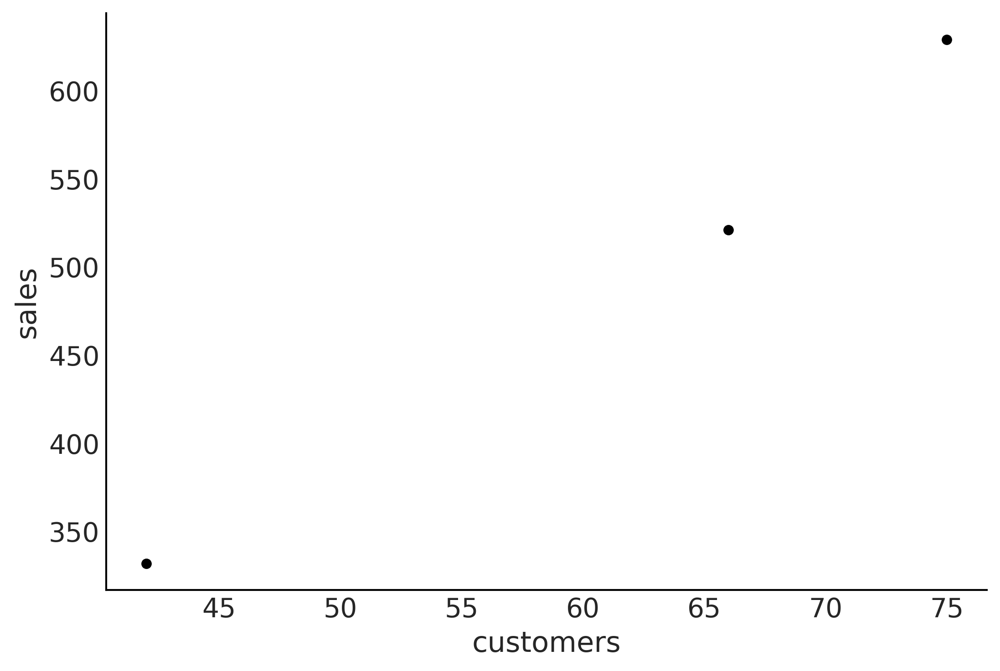

In [33]:
pizza_df = generate_sales(days=365, mean=13, std=5, label="Pizza")
sandwich_df = generate_sales(days=100, mean=6, std=5, label="Sandwich")

salad_days = 3
salad_df = generate_sales(days=salad_days, mean=8 ,std=3, label="Salad")

salad_df.plot(x="customers", y="sales", kind="scatter");

In [34]:
sales_df = pd.concat([pizza_df, sandwich_df, salad_df]).reset_index(drop=True)
sales_df["Food_Category"] = pd.Categorical(sales_df["Food_Category"])
sales_df

,customers,sales,Food_Category
0,31,459.895203,Pizza
1,31,401.147736,Pizza
2,31,413.345245,Pizza
3,31,371.909241,Pizza
4,32,433.797089,Pizza
...,...,...,...
463,100,611.736816,Sandwich
464,100,667.152954,Sandwich
465,42,331.625702,Salad
466,66,520.900940,Salad


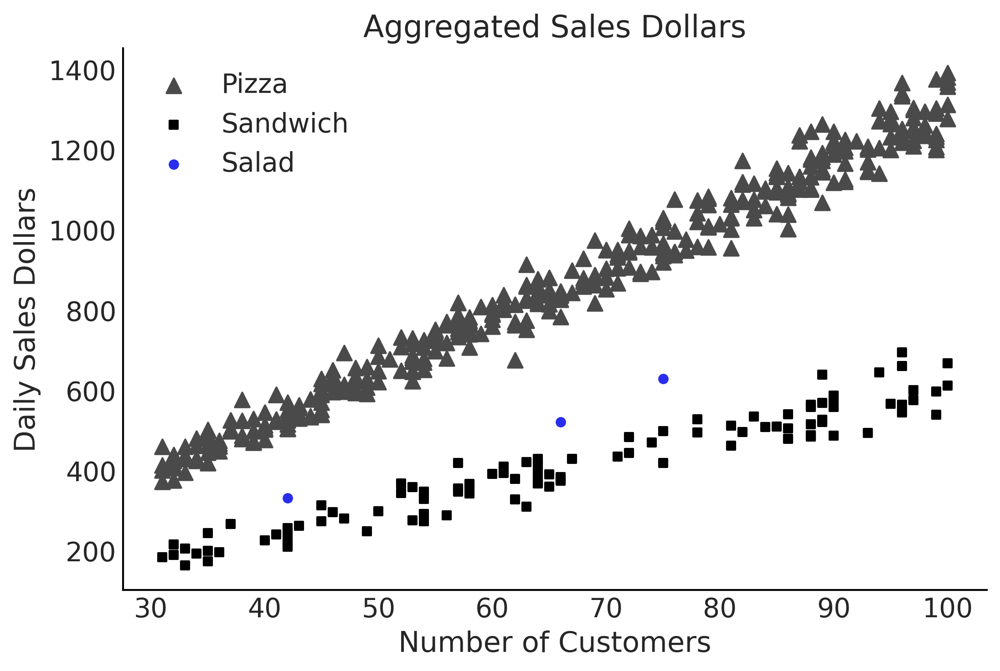

In [35]:
fig, ax = plt.subplots()
pizza_df.plot(x="customers", y="sales", kind="scatter", ax=ax, c="C1", label="Pizza", marker="^", s=60);
sandwich_df.plot(x="customers", y="sales", kind="scatter", ax=ax,  label="Sandwich", marker="s");
salad_df.plot(x="customers", y="sales", kind="scatter", ax=ax, label="Salad", c="C4");

ax.set_xlabel("Number of Customers")
ax.set_ylabel("Daily Sales Dollars")
ax.set_title("Aggregated Sales Dollars")
ax.legend()

plt.savefig('img/chp04/restaurant_order_scatter.png', dpi=300)

## All parameters unpooled 

In [36]:
customers = sales_df.loc[:, "customers"].values
sales = sales_df.loc[:, "sales"].values
food_category = pd.Categorical(sales_df["Food_Category"])

with pm.Model() as model_sales_unpooled:
    σ = pm.HalfNormal("σ", 20, shape=3)
    β = pm.Normal('β', mu=10, sd=10, shape=3)
    
    μ = pm.Deterministic('μ', β[food_category.codes]*customers)
    
    sales = pm.Normal("sales", mu=μ, sd=σ[food_category.codes],
                        observed=sales)
    
    trace_sales_unpooled = pm.sample(target_accept=.95)
    
    inf_data_sales_unpooled = az.from_pymc3(trace=trace_sales_unpooled, 
        coords={"β_dim_0":food_category.categories,
                "σ_dim_0":food_category.categories})

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/3779304405.py:14: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_sales_unpooled = pm.sample(target_accept=.95)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β, σ]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 16 seconds.


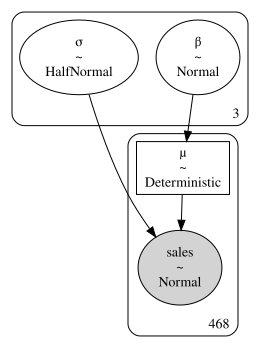

In [37]:
sales_unpooled_diagram = pm.model_to_graphviz(model_sales_unpooled)
sales_unpooled_diagram.render("img/chp04/salad_sales_basic_regression_model_unpooled", format="png", cleanup=True)
sales_unpooled_diagram

In [38]:
inf_data_salads_sales_unpooled = inf_data_sales_unpooled.posterior.sel(β_dim_0="Salad", μ_dim_0=slice(465, 467))

In [39]:
az.summary(inf_data_sales_unpooled, var_names=["β", "σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β[0],13.024,0.030,12.970,13.079,0.000,0.000,4948.0,2796.0,1.0
β[1],8.125,0.211,7.721,8.538,0.004,0.003,3000.0,2070.0,1.0
β[2],6.113,0.053,6.017,6.215,0.001,0.000,6256.0,3014.0,1.0
σ[0],40.168,1.445,37.609,42.995,0.023,0.016,3918.0,2702.0,1.0
σ[1],21.420,8.357,9.129,37.252,0.159,0.118,3121.0,2832.0,1.0
σ[2],35.942,2.584,31.566,41.123,0.038,0.027,4787.0,2865.0,1.0


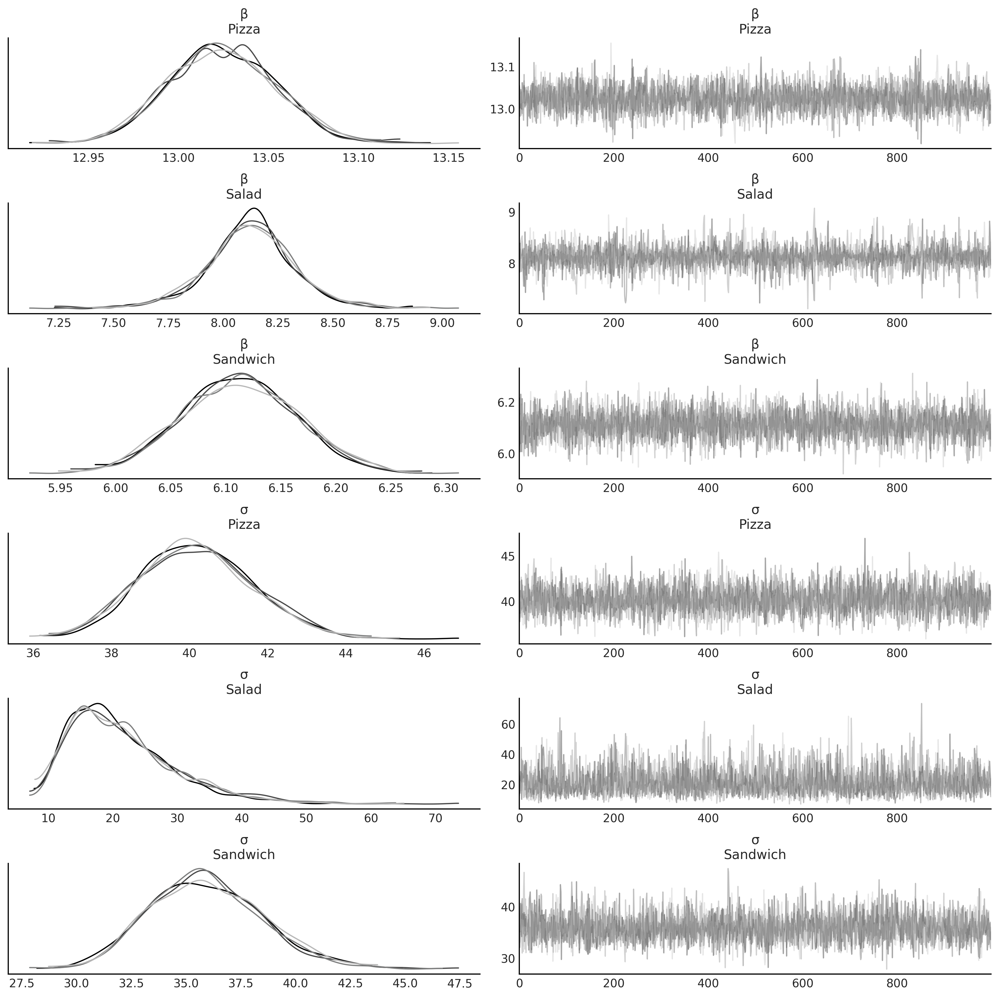

In [40]:
az.plot_trace(inf_data_sales_unpooled, var_names=["β", "σ"], compact=False);

### Unpooled Forest Plot of Parameters

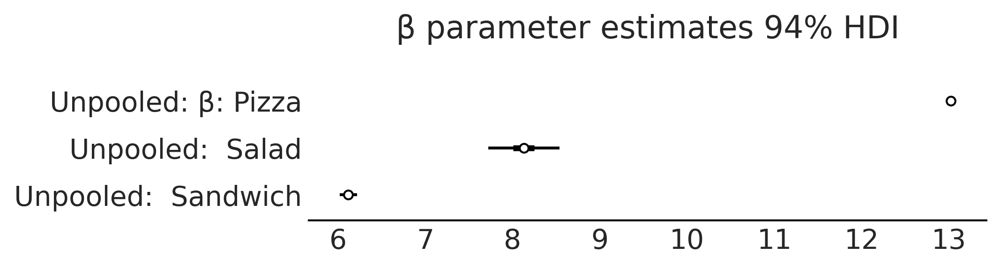

In [41]:
axes = az.plot_forest([inf_data_sales_unpooled],
                      model_names = ["Unpooled",],
                      var_names=["β"], combined=True, figsize=(7, 1.8));
axes[0].set_title("β parameter estimates 94% HDI")
plt.savefig("img/chp04/salad_sales_basic_regression_forestplot_beta.png")

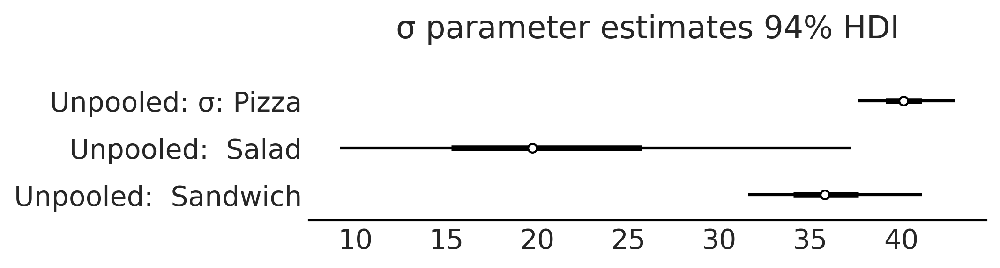

In [42]:
axes = az.plot_forest([inf_data_salads_sales_unpooled,],
                      model_names = ["Unpooled",],
                      var_names=["σ"], combined=True, figsize=(7, 1.8));
axes[0].set_title("σ parameter estimates 94% HDI")
plt.savefig("img/chp04/salad_sales_basic_regression_forestplot_sigma.png")

## Pooled Sales

In [43]:
with pm.Model() as model_pooled_sales:
    σ = pm.HalfNormal("σ", 20)
    β = pm.Normal('β', mu=10, sd=10)
    μ = pm.Deterministic('μ', β * sales_df.customers)
    
    sales = pm.Normal("sales", mu=μ, sd=σ, observed=sales_df.sales)
    
    trace_sales_pooled = pm.sample(2000)
    ppc_sales_pooled = pm.sample_posterior_predictive(trace_sales_pooled)
    inf_data_sales_pooled = az.from_pymc3(trace=trace_sales_pooled, posterior_predictive=ppc_sales_pooled)


/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/975842686.py:8: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_sales_pooled = pm.sample(2000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β, σ]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 16 seconds.


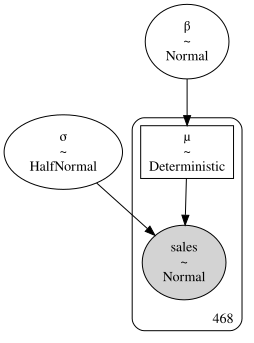

In [44]:
pooled_sales_diagram = pm.model_to_graphviz(model_pooled_sales)
pooled_sales_diagram.render("img/ch04/salad_sales_basic_Regression_Model_Pooled", format="png", cleanup=True)
pooled_sales_diagram

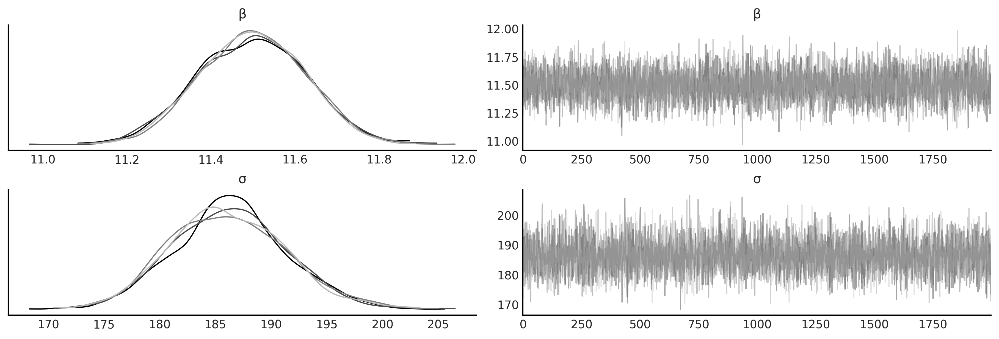

In [45]:
az.plot_trace(inf_data_sales_pooled, var_names=["β", "σ"], compact=False);

In [46]:
az.summary(inf_data_sales_pooled, var_names=["β", "σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β,11.498,0.127,11.259,11.729,0.001,0.001,7179.0,5530.0,1.0
σ,186.213,5.178,176.503,195.806,0.062,0.044,6935.0,5925.0,1.0


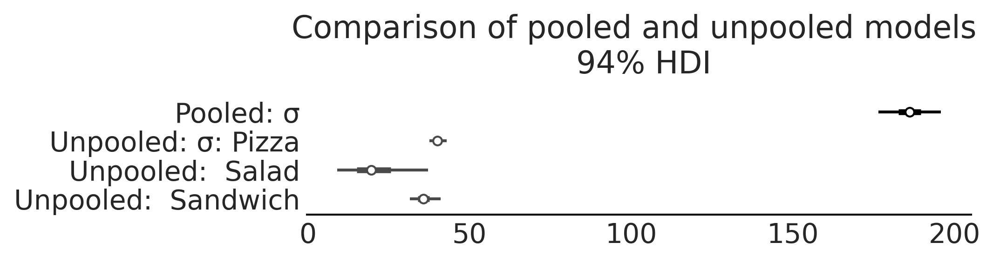

In [47]:
axes = az.plot_forest([inf_data_sales_pooled, inf_data_sales_unpooled],
                      model_names = ["Pooled", "Unpooled"], var_names=["σ"], combined=True, figsize=(7, 1.8));
axes[0].set_title("Comparison of pooled and unpooled models \n 94% HDI")

#plt.subplots_adjust(top=1)
plt.savefig("img/chp04/salad_sales_basic_regression_forestplot_sigma_comparison.png", bbox_inches='tight')

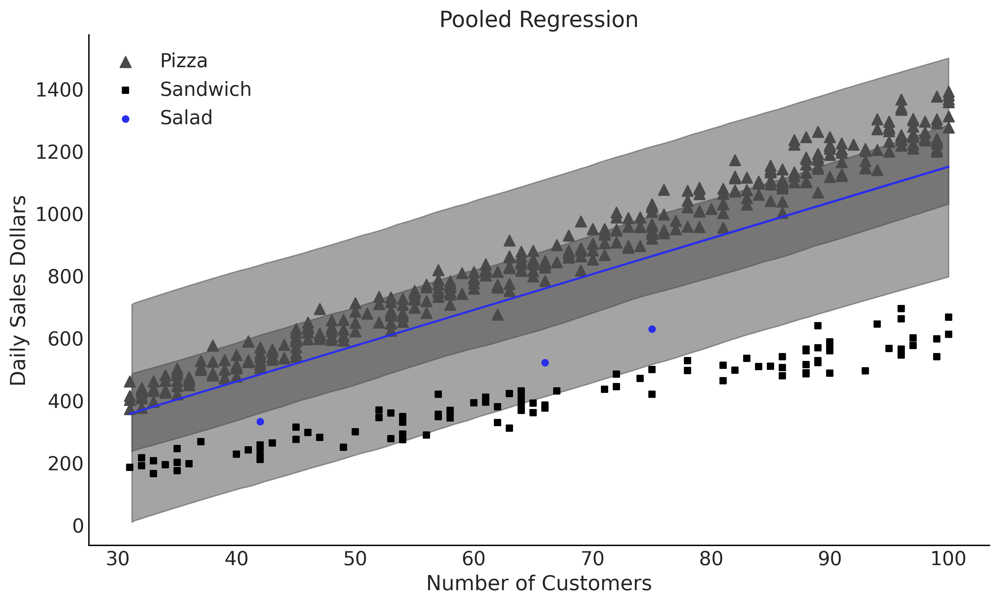

In [48]:
fig, ax = plt.subplots(figsize=(10, 6))
μ_m = inf_data_sales_pooled.posterior["μ"].values.reshape(-1, sales_df.shape[0]).mean(axis=0)
σ_m = inf_data_sales_pooled.posterior["σ"].mean().values

ax.plot(sales_df.customers, μ_m, c='C4')

az.plot_hdi(sales_df.customers, inf_data_sales_pooled.posterior_predictive["sales"], hdi_prob=.50, ax=ax)
az.plot_hdi(sales_df.customers, inf_data_sales_pooled.posterior_predictive["sales"], hdi_prob=.94, ax=ax)


pizza_df.plot(x="customers", y="sales", kind="scatter", ax=ax, c="C1", label="Pizza", marker="^", s=60);
sandwich_df.plot(x="customers", y="sales", kind="scatter", ax=ax,  label="Sandwich", marker="s");
salad_df.plot(x="customers", y="sales", kind="scatter", ax=ax, label="Salad", c="C4");


ax.set_xlabel("Number of Customers")
ax.set_ylabel("Daily Sales Dollars")
ax.set_title("Pooled Regression")
plt.savefig("img/chp04/salad_sales_basic_regression_scatter_pooled.png")

## Sales Pooled Sigma, Unpooled Slope 

In [49]:
with pm.Model() as model_pooled_sigma_sales:
    
    σ = pm.HalfNormal("σ", 20)
    β = pm.Normal('β', mu=10, sd=20, shape=3)
    
    μ = pm.Deterministic('μ', β[food_category.codes] * sales_df.customers.values)
    
    sales = pm.Normal("sales", mu=μ, sd=σ, observed=sales_df.sales)
    

    trace_pooled_sigma_sales = pm.sample(target_accept=.95)
    ppc_pooled_sigma_sales = pm.sample_posterior_predictive(
                                    trace_pooled_sigma_sales)

    
    inf_data_pooled_sigma_sales = az.from_pymc3(
        trace=trace_pooled_sigma_sales,
        posterior_predictive=ppc_pooled_sigma_sales,
        coords={"β_dim_0":food_category.categories})

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/549250068.py:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_pooled_sigma_sales = pm.sample(target_accept=.95)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β, σ]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 15 seconds.


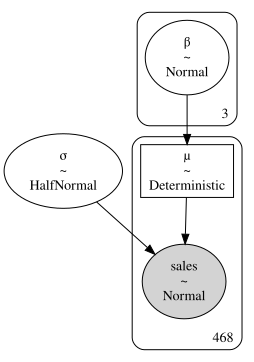

In [50]:
multilevel_sales_diagram = pm.model_to_graphviz(model_pooled_sigma_sales)
multilevel_sales_diagram.render("img/ch04/salad_sales_basic_regression_model_multilevel", format="png", cleanup=True)
multilevel_sales_diagram

In [51]:
az.summary(inf_data_pooled_sigma_sales, var_names=["β", "σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β[0],13.023,0.030,12.969,13.080,0.000,0.000,4837.0,2920.0,1.0
β[1],8.120,0.362,7.471,8.823,0.005,0.004,4593.0,2787.0,1.0
β[2],6.113,0.058,6.003,6.221,0.001,0.001,4611.0,2533.0,1.0
σ,39.236,1.274,36.821,41.599,0.019,0.013,4618.0,2914.0,1.0


### Plot of Sigma Pooled Slope Unpooled


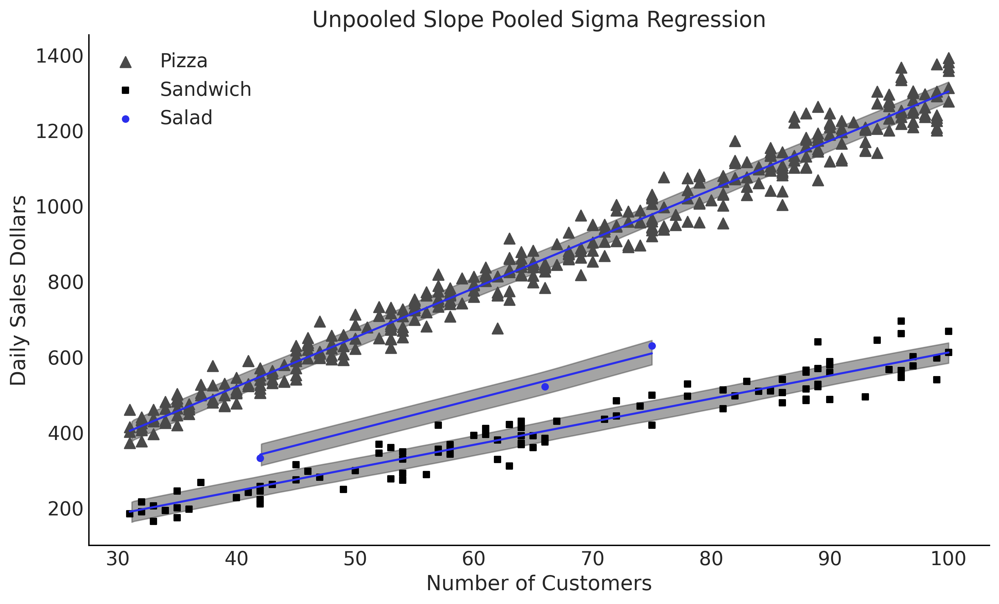

In [52]:
fig, ax = plt.subplots(figsize=(10, 6))
σ_m = inf_data_sales_pooled.posterior["σ"].mean().values

# Salads

for i in range(3):
    category_mask = (food_category.codes==i)
    μ_m_salads = inf_data_pooled_sigma_sales.posterior["μ"][:,:, category_mask].mean(axis=(0,1))
    ax.plot(sales_df.customers[category_mask], μ_m_salads, c='C4')
    az.plot_hdi(sales_df.customers[category_mask], inf_data_pooled_sigma_sales.posterior_predictive["sales"][:,:, (category_mask)], hdi_prob=.50, ax=ax, fill_kwargs={"alpha": .5})
    #az.plot_hdi(sales_df.customers[category_mask], inf_data_pooled_sigma_sales.posterior_predictive["sales"][:,:, (category_mask)], hdi_prob=.94, ax=ax)


pizza_df.plot(x="customers", y="sales", kind="scatter", ax=ax, c="C1", label="Pizza", marker="^", s=60);
sandwich_df.plot(x="customers", y="sales", kind="scatter", ax=ax,  label="Sandwich", marker="s");
salad_df.plot(x="customers", y="sales", kind="scatter", ax=ax, label="Salad", c="C4");


ax.set_xlabel("Number of Customers")
ax.set_ylabel("Daily Sales Dollars")
ax.set_title("Unpooled Slope Pooled Sigma Regression")
plt.savefig("img/chp04/salad_sales_basic_regression_scatter_sigma_pooled_slope_unpooled.png")

### Forest Plot comparison of unpooled and multilevel model

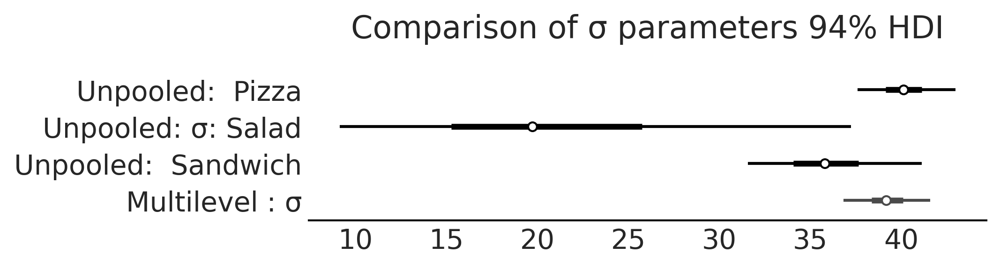

In [53]:
axes = az.plot_forest([inf_data_sales_unpooled,
                       inf_data_pooled_sigma_sales
                      ],
                      model_names = ["Unpooled",
                                     "Multilevel "
                                    ],
                      var_names=["σ"], combined=True, figsize=(7, 1.8));
axes[0].set_title("Comparison of σ parameters 94% HDI")

plt.savefig("img/chp04/salad_sales_forestplot_sigma_unpooled_multilevel_comparison.png")

Text(0.5, 1.0, 'Comparison of β parameters 94% HDI')

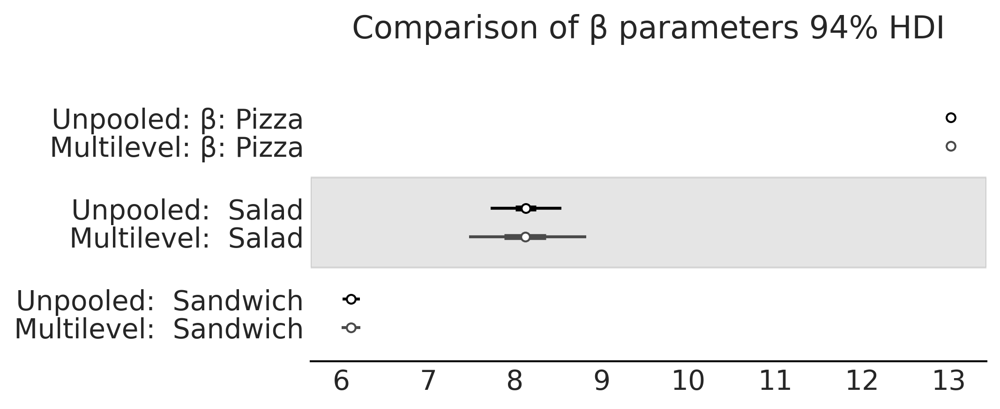

In [54]:
axes = az.plot_forest([inf_data_sales_unpooled,
                       inf_data_pooled_sigma_sales
                      ],
                      model_names = ["Unpooled",
                                     "Multilevel"
                                    ],
                      var_names=["β"], combined=True, figsize=(7, 2.8));
axes[0].set_title("Comparison of β parameters 94% HDI")

In [55]:
inf_posterior_salads = inf_data_pooled_sigma_sales.posterior.sel(β_dim_0="Salad", μ_dim_0=slice(465, 467))

## Hierarchial Regression with homoskedasticity

In [56]:
with pm.Model() as model_hierarchical_sales:
   
    σ_hyperprior = pm.HalfNormal("σ_hyperprior", 20)

    σ = pm.HalfNormal("σ", σ_hyperprior, shape=3)
    
    β = pm.Normal('β', mu=10, sd=20, shape=3)
    μ = pm.Deterministic('μ', β[food_category.codes] * sales_df.customers)
    
    sales = pm.Normal("sales", mu=μ, sd=σ[food_category.codes],
                      observed=sales_df.sales)
    
    trace_hierarchical_sales = pm.sample(random_seed=0, target_accept=.95)
    
    inf_data_hierarchical_sales = az.from_pymc3(trace=trace_hierarchical_sales, 
        coords={"β_dim_0":food_category.categories,
                "σ_dim_0":food_category.categories})

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/3847654838.py:13: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_hierarchical_sales = pm.sample(random_seed=0, target_accept=.95)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β, σ, σ_hyperprior]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 16 seconds.


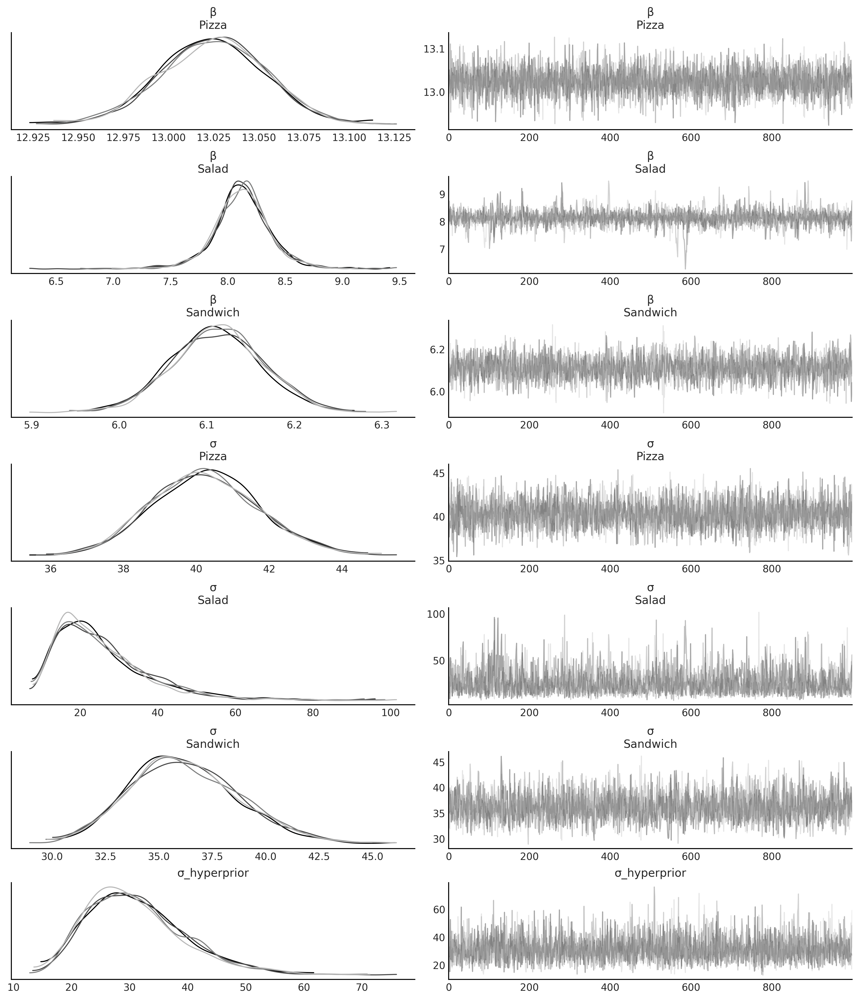

In [57]:
az.plot_trace(inf_data_hierarchical_sales, compact=False, var_names=["β", "σ", "σ_hyperprior"]);

<AxesSubplot:>

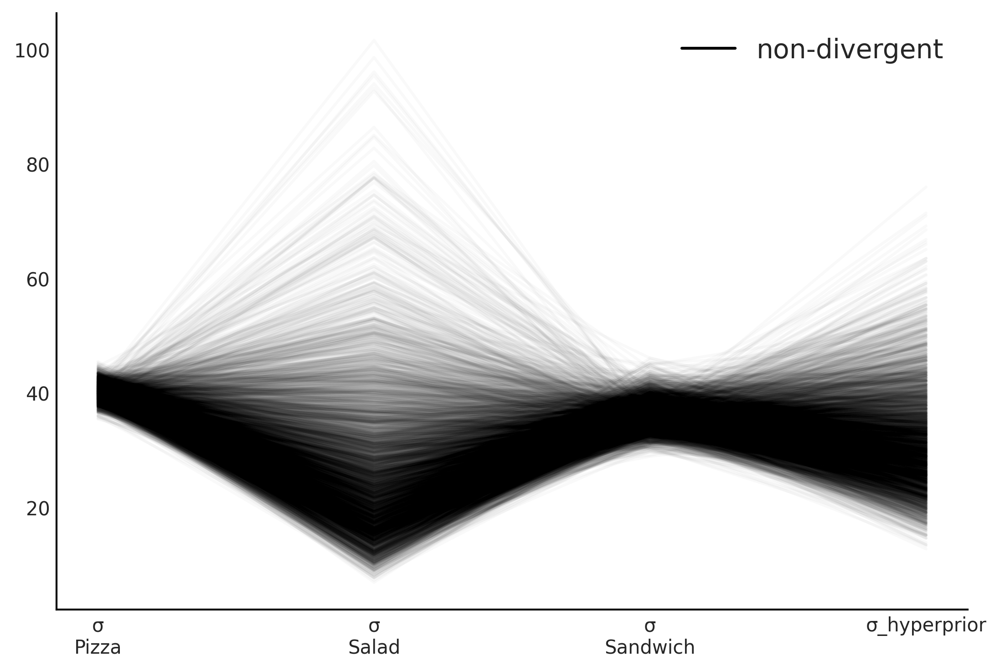

In [58]:
az.plot_parallel(inf_data_hierarchical_sales, var_names=["σ", "σ_hyperprior"])

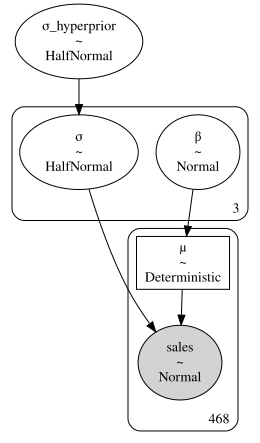

In [59]:
hierarchial_sales_diagram = pm.model_to_graphviz(model_hierarchical_sales)
hierarchial_sales_diagram.render("img/chp04/salad_sales_hierarchial_regression_model", format="png", cleanup=True)
hierarchial_sales_diagram

In [60]:
az.summary(inf_data_hierarchical_sales, var_names=["β", "σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β[0],13.025,0.030,12.969,13.080,0.000,0.000,5318.0,2894.0,1.0
β[1],8.126,0.259,7.637,8.622,0.006,0.004,2258.0,1851.0,1.0
β[2],6.112,0.052,6.016,6.211,0.001,0.001,3781.0,3136.0,1.0
σ[0],40.266,1.507,37.458,43.162,0.023,0.016,4194.0,3053.0,1.0
σ[1],25.681,12.393,8.864,48.346,0.261,0.194,2717.0,2576.0,1.0
σ[2],36.232,2.591,31.357,41.037,0.043,0.031,3694.0,2745.0,1.0


### Forestplot Hierarchical of beta and sigma 

Text(0.5, 1.0, 'Hierarchical β estimates 94% HDI')

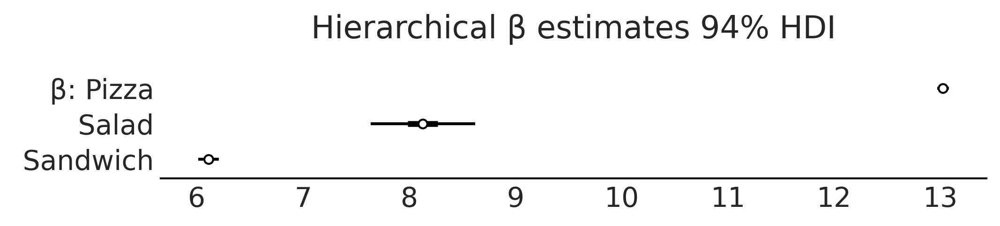

In [61]:
axes = az.plot_forest(inf_data_hierarchical_sales, var_names=["β"], combined=True,  figsize=(7, 1.5))
axes[0].set_title("Hierarchical β estimates 94% HDI")

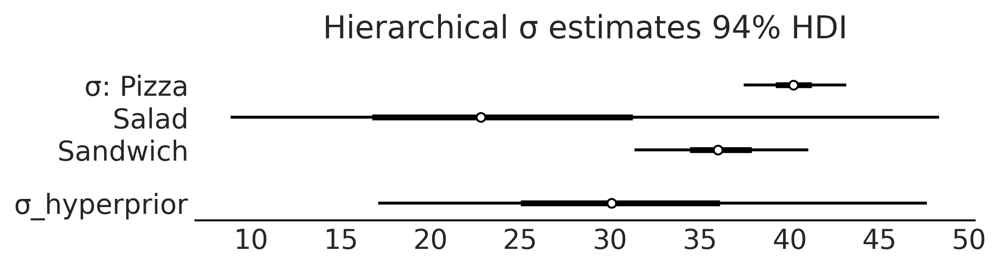

In [62]:
axes = az.plot_forest(inf_data_hierarchical_sales, var_names=["σ", "σ_hyperprior"], combined=True,  figsize=(7, 1.8))
axes[0].set_title("Hierarchical σ estimates 94% HDI")
plt.savefig("img/chp04/salad_sales_forestplot_sigma_hierarchical.png")


In [63]:
print(food_category.categories)

Index(['Pizza', 'Salad', 'Sandwich'], dtype='object')


In [64]:
az.summary(inf_data_sales_unpooled.posterior["σ"], kind="stats").round(1)

,mean,sd,hdi_3%,hdi_97%
σ[0],40.2,1.4,37.6,43.0
σ[1],21.4,8.4,9.1,37.3
σ[2],35.9,2.6,31.6,41.1


In [65]:
az.summary(inf_data_hierarchical_sales, var_names=["σ", "σ_hyperprior"], kind="stats").round(1)

,mean,sd,hdi_3%,hdi_97%
σ[0],40.3,1.5,37.5,43.2
σ[1],25.7,12.4,8.9,48.3
σ[2],36.2,2.6,31.4,41.0
σ_hyperprior,31.3,8.6,17.1,47.6


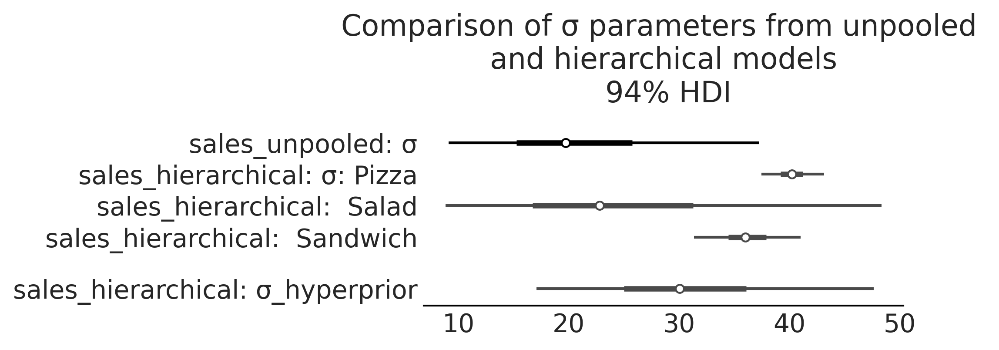

In [66]:
axes = az.plot_forest([inf_data_sales_unpooled.posterior["σ"].isel(σ_dim_0=1),
                       inf_data_hierarchical_sales
                      ],
                      model_names = ["sales_unpooled",
                                     "sales_hierarchical"
                                    ], combined=True, figsize=(7, 2.6),
                     var_names=["σ", "σ_hyperprior"]
                     );
axes[0].set_title("Comparison of σ parameters from unpooled \n and hierarchical models \n 94% HDI")

plt.savefig("img/chp04/salad_sales_forestolot_sigma_unpooled_multilevel_comparison.png")

Text(0.5, 1.0, 'Comparison of Hierarchical versus Unpooled Variance')

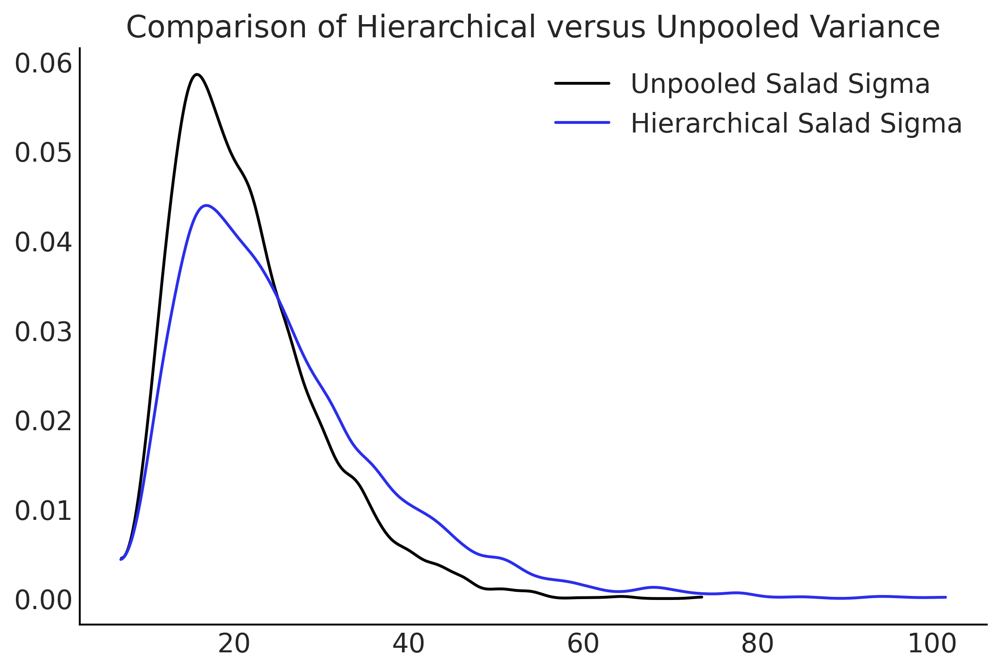

In [67]:
fig, ax = plt.subplots()
az.plot_kde(inf_data_sales_unpooled.posterior['σ'].isel(σ_dim_0=1), label="Unpooled Salad Sigma", ax=ax)
az.plot_kde(inf_data_hierarchical_sales.posterior["σ"].isel(σ_dim_0=1), label="Hierarchical Salad Sigma", plot_kwargs={"color":"C4"}, ax=ax);

ax.set_title("Comparison of Hierarchical versus Unpooled Variance")

## Neals Funnel

Text(0, 0.5, 'y')

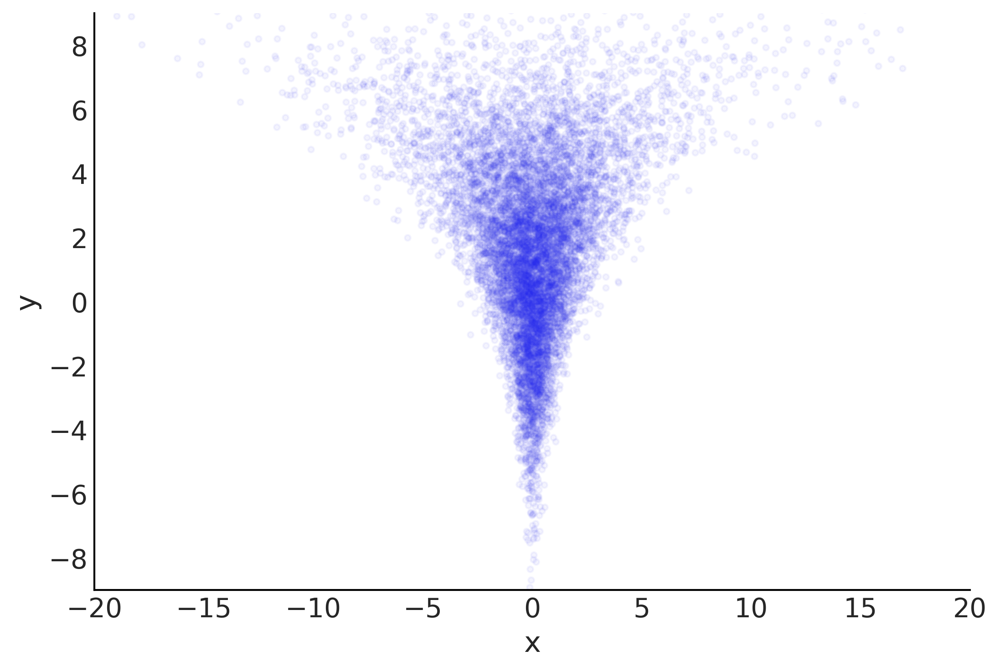

In [68]:
nsample = 10000
nd=1
yr = stats.norm.rvs(loc=2., scale=3., size=nsample)
xnr = stats.norm.rvs(loc=0., scale=np.exp(yr/4), size=(nd, nsample))

fig, ax = plt.subplots()
ax.scatter(xnr[0], yr, marker='.', alpha=.05, color="C4")
ax.set_xlim(-20, 20)
ax.set_ylim(-9, 9)
ax.set_xlabel('x')
ax.set_ylabel('y')

## Multiple Salad Locations

I set a really small sd for hyperprior to force sampler to sample near 0. I also set a low number of datapoints for the same reason
See the kwargs

In [69]:
def salad_generator(hyperprior_beta_mean=5, hyperprior_beta_sd=.2, sigma=50, days_per_location=[6, 4, 15, 10, 3, 5], sigma_per_location=[50,10,20,80,30,20]):
    """Generate noisy salad data"""
    beta_hyperprior = stats.norm(hyperprior_beta_mean, hyperprior_beta_sd)
    
    # Generate demands days per restaurant
    df = pd.DataFrame()
    for i, days in enumerate(days_per_location):
        np.random.seed(0)

        num_customers = stats.randint(30, 100).rvs(days)
        sales_location = beta_hyperprior.rvs()*num_customers + stats.norm(0, sigma_per_location[i]).rvs(num_customers.shape)

        location_df = pd.DataFrame({"customers":num_customers, "sales":sales_location})
        location_df["location"] = i
        location_df.sort_values(by="customers", ascending=True)
        df = pd.concat([df, location_df])
        
    df.reset_index(inplace=True, drop=True)
    return df
hierarchical_salad_df = salad_generator()

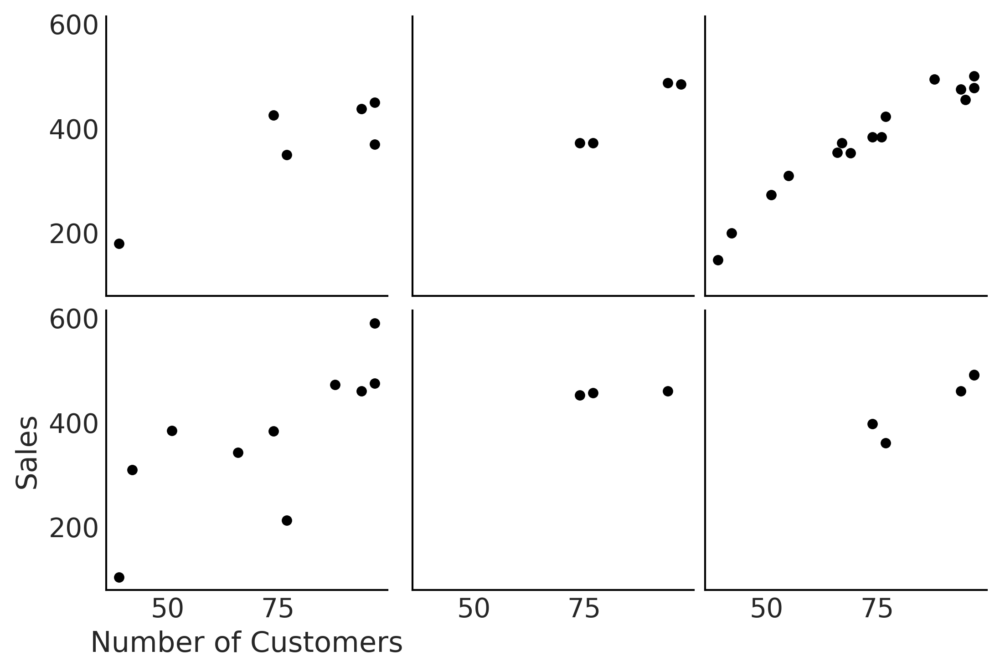

In [70]:
fig, axes, = plt.subplots(2,3, sharex=True, sharey=True)

for i, ax in enumerate(axes.ravel()):
    location_filter = (hierarchical_salad_df["location"] == i)
    hierarchical_salad_df[location_filter].plot(kind="scatter", x="customers", y="sales", ax=ax)
    ax.set_xlabel("")
    ax.set_ylabel("")

    
axes[1,0].set_xlabel("Number of Customers")
axes[1,0].set_ylabel("Sales");
plt.savefig("img/chp04/multiple_salad_sales_scatter.png")

### Centered Parameterization

In [71]:
customers = hierarchical_salad_df.loc[:, "customers"].values
sales = hierarchical_salad_df.loc[:, "sales"].values
location_category = pd.Categorical(hierarchical_salad_df["location"])

with pm.Model() as model_hierarchical_salad_sales_centered:
   
    β_μ_hyperprior = pm.Normal("β_μ_hyperprior", 0, 10)
    β_σ_hyperprior = pm.HalfNormal("β_σ_hyperprior", .1)
    β = pm.Normal('β', mu=β_μ_hyperprior, sd=β_σ_hyperprior, shape=6)

    σ_hyperprior = pm.HalfNormal("σ_hyperprior", 30)
    σ = pm.HalfNormal("σ", σ_hyperprior, shape=6)

    μ = pm.Deterministic('μ', β[location_category.codes] * hierarchical_salad_df.customers)
    
    sales = pm.Normal("sales", mu=μ, sd=σ[location_category.codes], observed=hierarchical_salad_df.sales)
    
    trace_hierarchical_salad_sales_centered = pm.sample(random_seed=0)
    
    inf_data_hierarchical_salad_sales_centered = az.from_pymc3(trace=trace_hierarchical_salad_sales_centered, 
                                                            coords={"β_dim_0":location_category.categories})

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/351285691.py:18: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_hierarchical_salad_sales_centered = pm.sample(random_seed=0)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ, σ_hyperprior, β, β_σ_hyperprior, β_μ_hyperprior]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 18 seconds.
There were 140 divergences after tuning. Increase `target_accept` or reparameterize.
There were 137 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.7185365369539881, but should be close to 0.8. Try to increase the number of tuning steps.
There were 188 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.7168808481042444, but should be close to 0.8. Try to increase the number of tuning steps.
There were 132 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


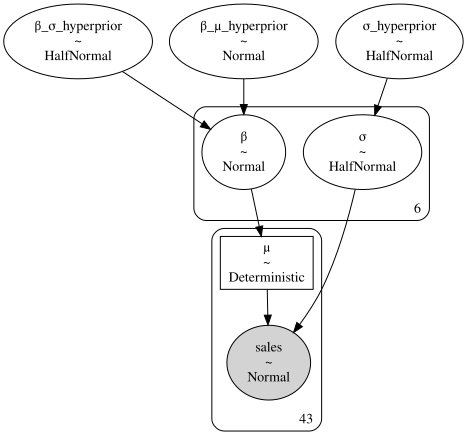

In [72]:
hierarchical_salad_sales_centered_diagram = pm.model_to_graphviz(model_hierarchical_salad_sales_centered)
hierarchical_salad_sales_centered_diagram.render("img/ch04/salad_sales_hierarchial_centered_diagram", format="png", cleanup=True)
hierarchical_salad_sales_centered_diagram

#### Funnel Plot

/Users/canyon/miniconda3/envs/bmcp/lib/python3.9/site-packages/arviz/plots/jointplot.py:144: UserWarning: plot_joint will be deprecated. Please use plot_pair instead.
  warnings.warn("plot_joint will be deprecated. Please use plot_pair instead.")


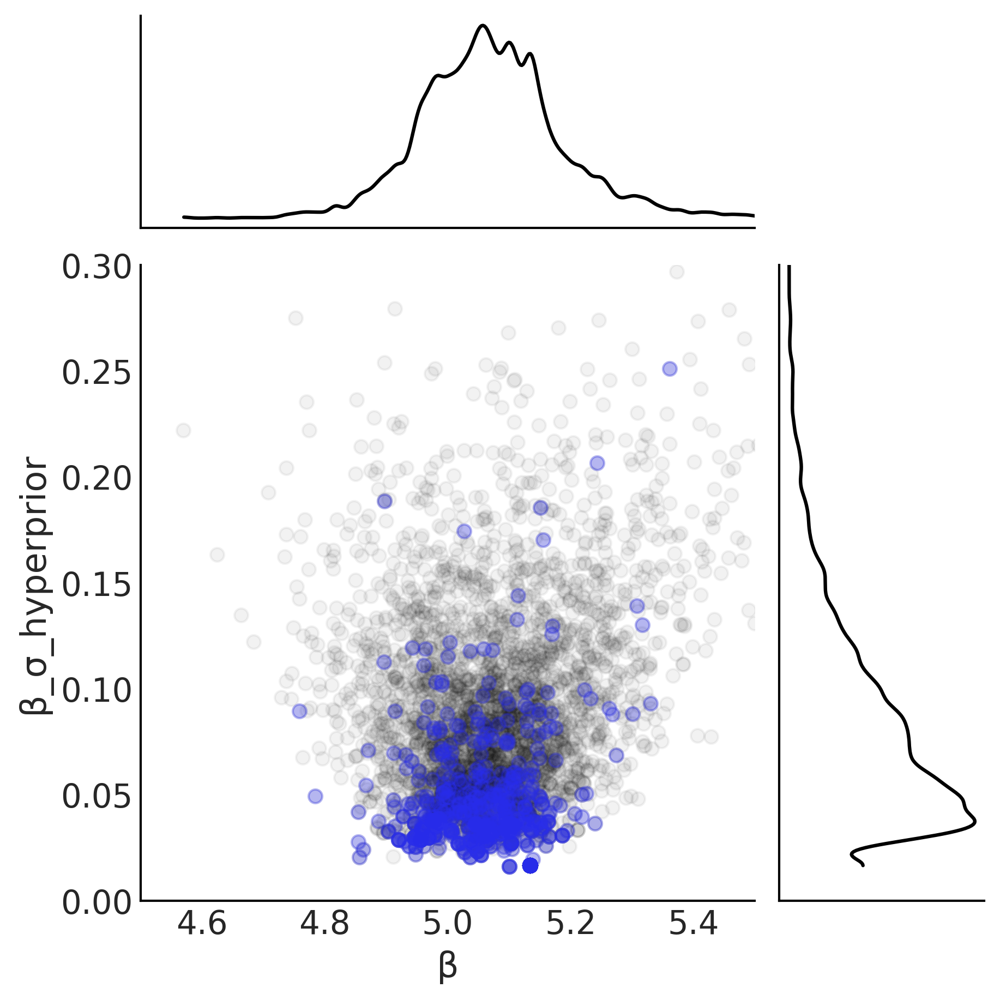

In [73]:
slope = trace_hierarchical_salad_sales_centered["β"][:,4]
sigma = inf_data_hierarchical_salad_sales_centered.posterior["β_σ_hyperprior"].values.flatten()
divergences = inf_data_hierarchical_salad_sales_centered.sample_stats['diverging'].values.flatten()

axes = az.plot_joint({"β":slope, "β_σ_hyperprior":sigma}, joint_kwargs={"alpha":.05}, figsize=(6,6))
axes[0].scatter(slope[divergences], sigma[divergences], c="C4", alpha=.3)
axes[0].set_ylim(0, .3)
axes[0].set_xlim(4.5, 5.5)

plt.savefig("img/chp04/neals_funnel_salad_centered.png")

In [74]:
divergences = inf_data_hierarchical_salad_sales_centered.sample_stats['diverging'].values.flatten()
divergences.sum()

597

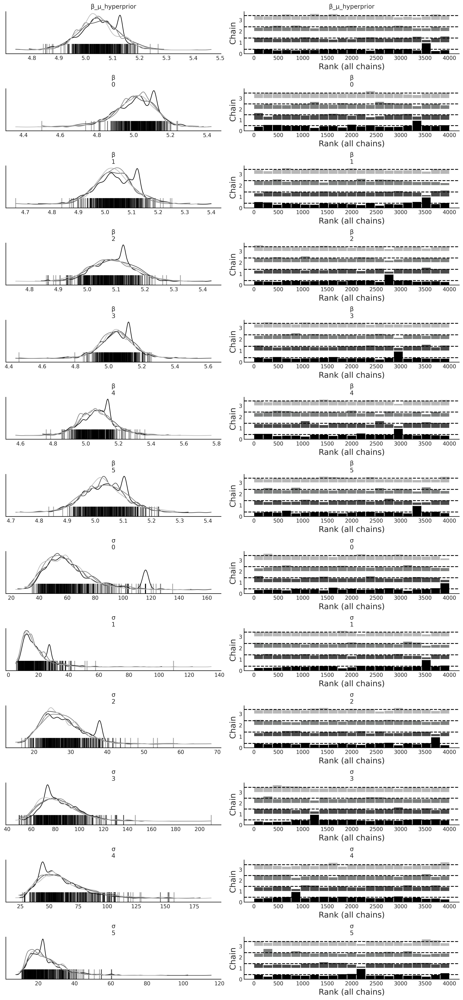

In [75]:
az.plot_trace(inf_data_hierarchical_salad_sales_centered, var_names=["β_μ_hyperprior", "β", "σ"], compact=False, kind="rank_bars");

## Non centered Parameterization

In [76]:
customers = hierarchical_salad_df.loc[:, "customers"].values
sales = hierarchical_salad_df.loc[:, "sales"].values
location_category = pd.Categorical(hierarchical_salad_df["location"])

with pm.Model() as model_hierarchical_salad_sales_non_centered:
   
    β_μ_hyperprior = pm.Normal("β_μ_hyperprior", 0, 10)
    β_σ_hyperprior = pm.HalfNormal("β_σ_hyperprior", .1)
    
    β_offset = pm.Normal('β_offset', mu=0, sd=1, shape=6)
    β = pm.Deterministic("β", β_μ_hyperprior + β_offset * β_σ_hyperprior)
    
    
    σ_hyperprior = pm.HalfNormal("σ_hyperprior", 30)
    σ = pm.HalfNormal("σ", σ_hyperprior, shape=6)
    
    μ = pm.Deterministic('μ', β[location_category.codes] * hierarchical_salad_df.customers)
    
    sales = pm.Normal("sales", mu=μ, sd=σ[location_category.codes], observed=hierarchical_salad_df.sales)
    
    trace_hierarchical_salad_sales_noncentered = pm.sample(random_seed=0)
    
    inf_data_hierarchical_salad_sales_noncentered = az.from_pymc3(trace=trace_hierarchical_salad_sales_noncentered, 
                                                            coords={"β_dim_0":location_category.categories})

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/2385561295.py:21: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_hierarchical_salad_sales_noncentered = pm.sample(random_seed=0)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ, σ_hyperprior, β_offset, β_σ_hyperprior, β_μ_hyperprior]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 21 seconds.
There were 8 divergences after tuning. Increase `target_accept` or reparameterize.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.
There were 16 divergences after tuning. Increase `target_accept` or reparameterize.
There were 4 divergences after tuning. Increase `target_accept` or reparameterize.


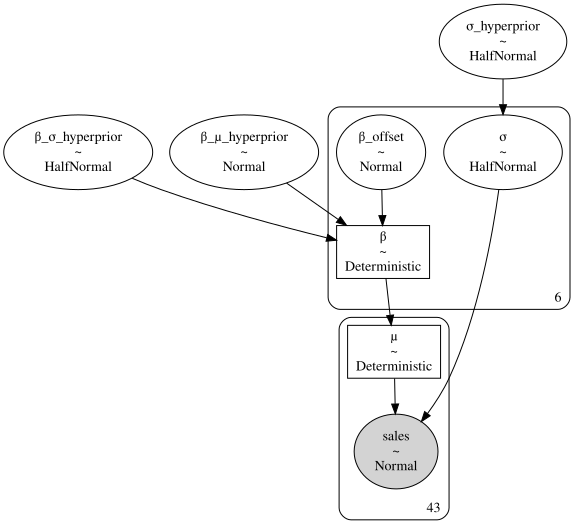

In [77]:
hierarchical_salad_sales_noncentered_diagram = pm.model_to_graphviz(model_hierarchical_salad_sales_non_centered)
hierarchical_salad_sales_noncentered_diagram.render("img/salad_sales_hierarchial_noncentered_diagram", format="png", cleanup=True)
hierarchical_salad_sales_noncentered_diagram

#### Funnel Plot

/Users/canyon/miniconda3/envs/bmcp/lib/python3.9/site-packages/arviz/plots/jointplot.py:144: UserWarning: plot_joint will be deprecated. Please use plot_pair instead.
  warnings.warn("plot_joint will be deprecated. Please use plot_pair instead.")


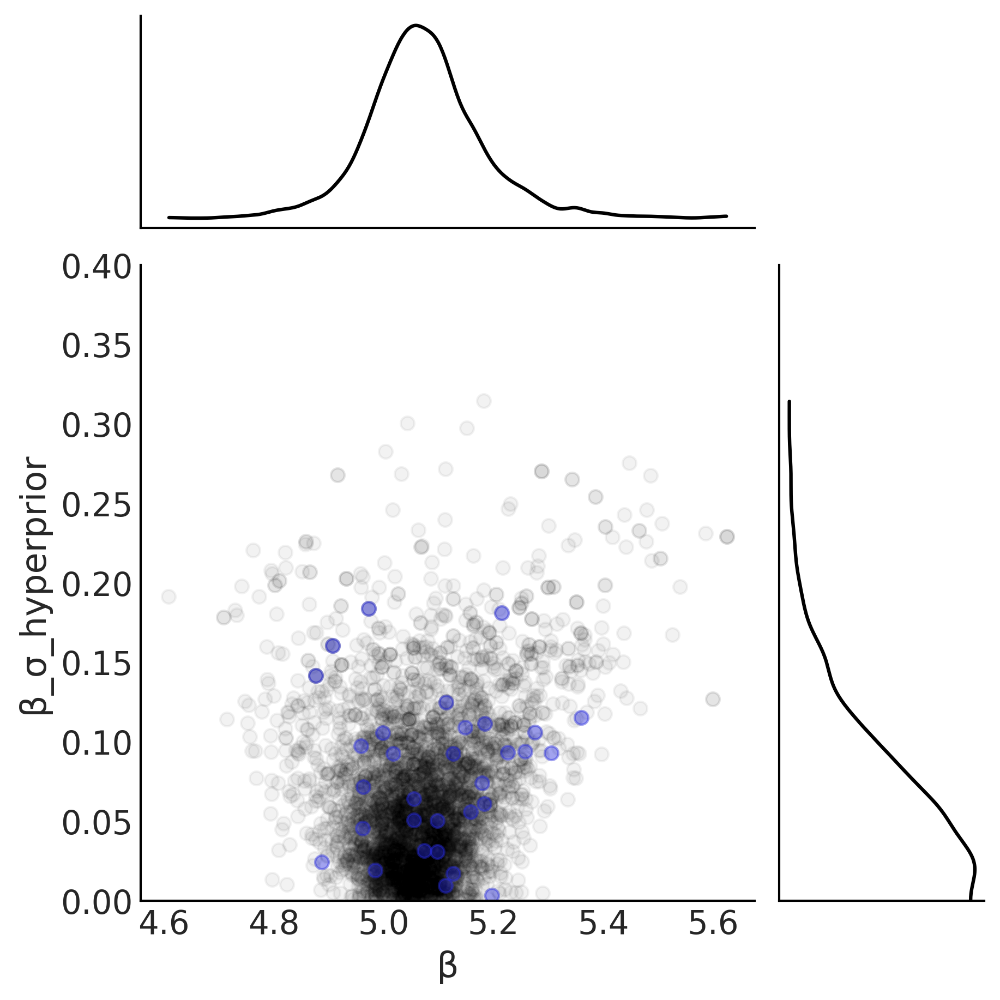

In [78]:
slope_noncentered = trace_hierarchical_salad_sales_noncentered["β"][:,4]
sigma_noncentered = inf_data_hierarchical_salad_sales_noncentered.posterior["β_σ_hyperprior"].values.flatten()
divergences_noncentered = inf_data_hierarchical_salad_sales_noncentered.sample_stats['diverging'].values.flatten()

axes = az.plot_joint({"β":slope_noncentered, "β_σ_hyperprior":sigma_noncentered}, joint_kwargs={"alpha":.05}, figsize=(6,6))
axes[0].scatter(slope_noncentered[divergences_noncentered], sigma_noncentered[divergences_noncentered], c="C4", alpha=.4)
axes[0].set_ylim(0, .4)
plt.savefig("img/chp04/neals_funnel_salad_noncentered.png")

In [79]:
divergences_noncentered.sum()

31

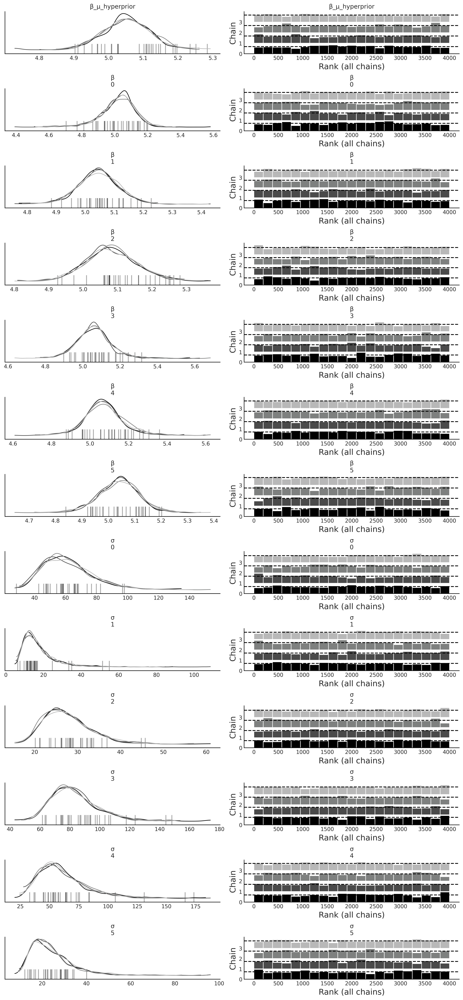

In [80]:
az.plot_trace(inf_data_hierarchical_salad_sales_noncentered, var_names=["β_μ_hyperprior", "β", "σ"], compact=False, kind="rank_bars");

In [81]:
inf_data_hierarchical_salad_sales_centered.posterior['β'].isel(β_dim_0=4).var()

<xarray.DataArray 'β' ()>
array(0.01370756)
Coordinates:
    β_dim_0  int64 4

In [82]:
inf_data_hierarchical_salad_sales_noncentered.posterior['β'].isel(β_dim_0=4).var()

<xarray.DataArray 'β' ()>
array(0.01132116)
Coordinates:
    β_dim_0  int64 4

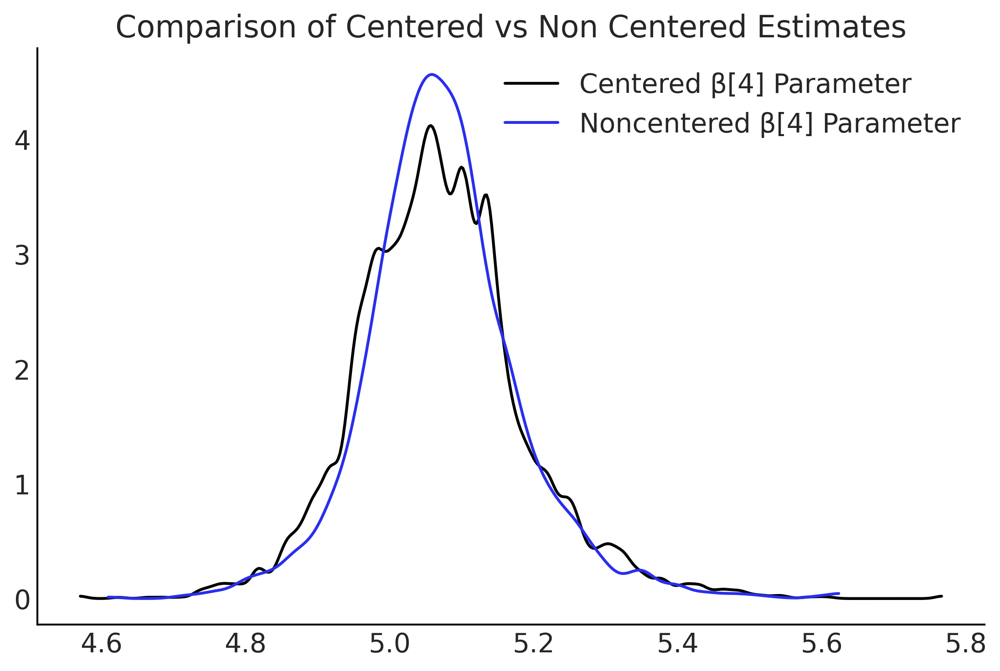

In [84]:
fig, ax = plt.subplots()
az.plot_kde(inf_data_hierarchical_salad_sales_centered.posterior['β'].isel(β_dim_0=4), label="Centered β[4] Parameter", ax=ax)
az.plot_kde(inf_data_hierarchical_salad_sales_noncentered.posterior["β"].isel(β_dim_0=4), label="Noncentered β[4] Parameter", plot_kwargs={"color":"C4"}, ax=ax);
# ax.axvline(inf_data_hierarchical_salad_sales_centered.posterior['β'].isel(β_dim_0=4).mean(), label="Centered β[4] Mean Estimate")
# ax.axvline(inf_data_hierarchical_salad_sales_noncentered.posterior['β'].isel(β_dim_0=4).mean(), label="Centered β[4] Mean Estimate")

ax.set_title("Comparison of Centered vs Non Centered Estimates");
plt.savefig("img/chp04/salad_sales_hierarchical_comparison.png")

### Predictions at different levels 
For an advacned version see method created by Luciano Paz
https://discourse.pymc.io/t/how-do-we-predict-on-new-unseen-groups-in-a-hierarchical-model-in-pymc3/2571/2

In [85]:
customers = hierarchical_salad_df.loc[:, "customers"].values
customers = theano.shared(customers)

with pm.Model() as model_hierarchical_salad_sales_predictions:
    
    σ_hyperprior = pm.HalfNormal("σ_hyperprior", 30)
    σ = pm.HalfNormal("σ", σ_hyperprior, shape=6)
    
    β_μ_hyperprior = pm.Normal("β_μ_hyperprior", 10, 10)
    β_σ_hyperprior = pm.HalfNormal("β_σ_hyperprior", 10)
    β_offset = pm.Normal('β_offset', mu=0, sd=1, shape=6)
    
    β = pm.Deterministic("β", β_μ_hyperprior + β_offset * β_σ_hyperprior)
    
    μ = pm.Deterministic('μ', β[location_category.codes] * customers)
    
    sales = pm.Normal("sales", mu=μ, sd=σ[location_category.codes], observed=hierarchical_salad_df.sales)
    trace_hierarchical_salad_sales_noncentered = pm.sample(random_seed=0)

/var/folders/nf/ch8x562s5q30j7qbf07161qr0000gp/T/ipykernel_6132/1327406941.py:18: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_hierarchical_salad_sales_noncentered = pm.sample(random_seed=0)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β_offset, β_σ_hyperprior, β_μ_hyperprior, σ, σ_hyperprior]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 20 seconds.
There were 14 divergences after tuning. Increase `target_accept` or reparameterize.
There were 26 divergences after tuning. Increase `target_accept` or reparameterize.
There were 76 divergences after tuning. Increase `target_accept` or reparameterize.
There were 75 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.714261190335179, but should be close to 0.8. Try to increase the number of tuning steps.
The number of effective samples is smaller than 10% for some parameters.


#### Reopen model trick

In [86]:
out_of_sample_customers = 50

with model_hierarchical_salad_sales_predictions:
    β_group = pm.Normal("group_beta_prediction", β_μ_hyperprior, β_σ_hyperprior)
    group_level_prediction = pm.Normal("group_level_prediction", β_group*out_of_sample_customers, σ_hyperprior)
    
    location_2_prediction = pm.Normal("location_2_prediction", β[2]*out_of_sample_customers, σ[2])
    location_4_prediction = pm.Normal("location_4_prediction", β[4]*out_of_sample_customers, σ[4])
    
    ppc = pm.sample_posterior_predictive(trace_hierarchical_salad_sales_noncentered, var_names=['group_level_prediction', 'location_2_prediction', 'location_4_prediction'], )

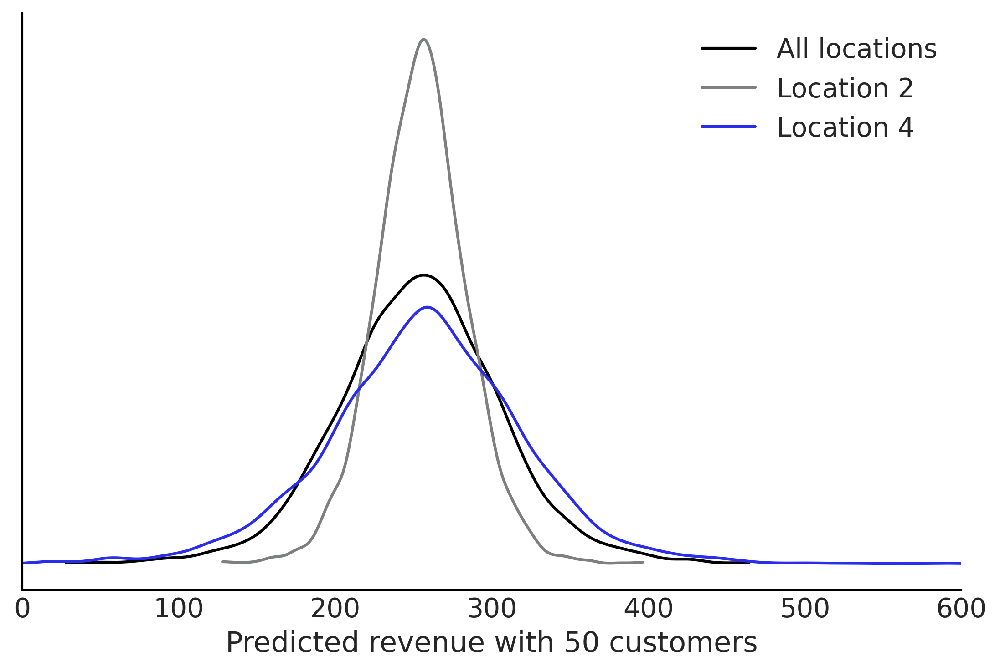

In [87]:
fig, ax = plt.subplots()

az.plot_kde(ppc["group_level_prediction"], plot_kwargs={"color":"C0"}, ax=ax, label="All locations")
az.plot_kde(ppc["location_2_prediction"], plot_kwargs={"color":"C2"}, ax=ax, label="Location 2")
az.plot_kde(ppc["location_4_prediction"], plot_kwargs={"color":"C4"}, ax=ax, label="Location 4")

ax.set_xlabel("Predicted revenue with 50 customers")
ax.set_xlim([0,600])

ax.set_yticks([])

plt.savefig("img/chp04/salad_sales_hierarchical_predictions.png")

In [88]:
# This cell should fail
customers.set_value([30, 50])
with model_hierarchical_salad_sales_predictions:
    ppc = pm.sample_posterior_predictive(trace_hierarchical_salad_sales_noncentered)

ValueError: Input dimension mis-match. (input[0].shape[0] = 43, input[1].shape[0] = 2)
Apply node that caused the error: Elemwise{Mul}[(0, 0)](AdvancedSubtensor1.0, <TensorType(int64, vector)>)
Toposort index: 5
Inputs types: [TensorType(float64, vector), TensorType(int64, vector)]
Inputs shapes: [(43,), (2,)]
Inputs strides: [(8,), (8,)]
Inputs values: ['not shown', array([30, 50])]
Outputs clients: [['output']]

HINT: Re-running with most Theano optimization disabled could give you a back-trace of when this node was created. This can be done with by setting the Theano flag 'optimizer=fast_compile'. If that does not work, Theano optimizations can be disabled with 'optimizer=None'.
HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.